Prac 1

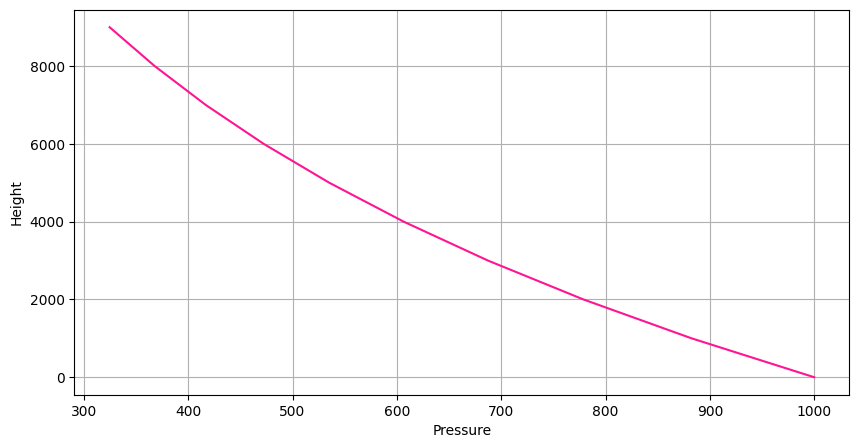

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

H=8000
p0=1000
dz=1000
g=9.8

def p(x):
    p=p0*np.exp(-x/H)
    return p

z=np.arange(0,10000,dz)

plt.plot(p(z),z, color = 'deeppink')
plt.ylabel('Height')
plt.xlabel('Pressure')
plt.grid(True)

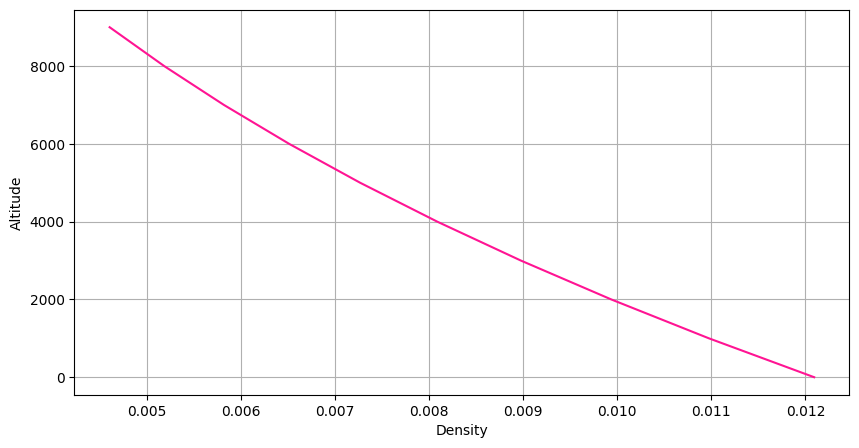

In [ ]:
R = 8.314
M = 0.02897
T0 = 288.15

altitude = np.arange(0, 10000, dz)

density = []
for h in altitude:
    T = T0 - 0.0065 * h
    P = p0 * (1 - 0.0065 * h / T0) ** (g * M / (R * 0.0065))
    rho = P * M / (R * T)
    density.append(rho)

plt.plot(density, altitude, color = 'deeppink')
plt.xlabel('Density')
plt.ylabel('Altitude')
plt.grid(True)
plt.show()

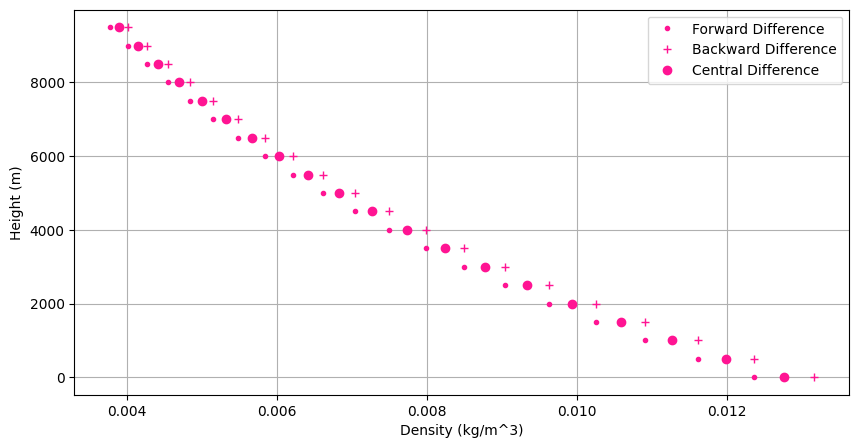

In [ ]:
dz = 500
z = np.arange(0, 10000, dz)
n = len(z)

def forward(b):
    densf = (-1 / g) * (p(b + dz) - p(b)) / dz
    return densf

def backward(b):
    densb = (-1 / g) * (p(b) - p(b - dz)) / dz
    return densb

def central(b):
    densc = (-1 / g) * (p(b + dz) - p(b - dz)) / (2 * dz)
    return densc

rhof = np.zeros(n)
rhob = np.zeros(n)
rhoc = np.zeros(n)

for i in range(0, n):
    rhof[i] = forward(z[i])

for i in range(0, n):
    rhob[i] = backward(z[i])

for i in range(0, n):
    rhoc[i] = central(z[i])

plt.plot(rhof, z, color='deeppink', linestyle='', marker='.', label='Forward Difference')
plt.plot(rhob, z, color='deeppink', linestyle='', marker='+', label='Backward Difference')
plt.plot(rhoc, z, color='deeppink', linestyle='', marker='o', label='Central Difference')
plt.legend()
plt.ylabel('Height (m)')
plt.xlabel('Density (kg/m^3)')
plt.grid(True)
plt.show()

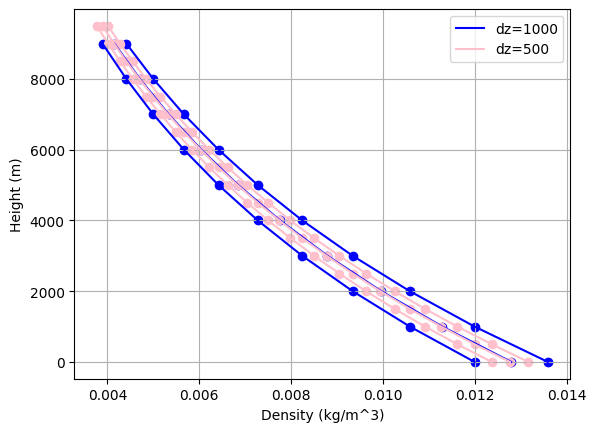

In [ ]:
dz = 500
z_new = np.arange(0, 10000, dz)
n_new = len(z_new)

rhof_new = np.zeros(n_new)
rhob_new = np.zeros(n_new)
rhoc_new = np.zeros(n_new)

for i in range(0, n_new):
    rhof_new[i] = forward(z_new[i])

for i in range(0, n_new):
    rhob_new[i] = backward(z_new[i])

for i in range(0, n_new):
    rhoc_new[i] = central(z_new[i])

plt.plot(rhof, z, 'blue', label= 'dz=1000')
plt.scatter(rhof, z, color='blue', marker='o')
plt.plot(rhob, z, 'blue')
plt.scatter(rhob, z, color='blue', marker='o')
plt.plot(rhoc, z, 'blue')
plt.scatter(rhoc, z, color='blue', marker='o')

plt.plot(rhof_new, z_new, 'pink', label='dz=500')
plt.scatter(rhof_new, z_new, color='pink', marker='o')
plt.plot(rhob_new, z_new, 'pink')
plt.scatter(rhob_new, z_new, color='pink', marker='o')
plt.plot(rhoc_new, z_new, 'pink')
plt.scatter(rhoc_new, z_new, color='pink', marker='o')

plt.legend()
plt.ylabel('Height (m)')
plt.xlabel('Density (kg/m^3)')
plt.grid(True)
plt.show()

In [ ]:
analytical_results = np.array(density)

dif_forward = np.abs(analytical_results - rhof)
dif_backward = np.abs(analytical_results - rhob)
dif_central = np.abs(analytical_results - rhoc)

print("Difference using Forward method:")
print(dif_forward)

print("Difference using Backward method:")
print(dif_backward)

print("Difference using Central method:")
print(dif_central)

Difference using Forward method:
[0.00010249 0.00039295 0.00059875 0.00073521 0.00081547 0.00085077
 0.0008507  0.00082339 0.0007757  0.00071339]
Difference using Backward method:
[1.49397229e-03 1.01592931e-03 6.44577840e-04 3.62021643e-04
 1.52833544e-04 3.75182991e-06 9.65875880e-05 1.57887433e-04
 1.88397458e-04 1.95098251e-04]
Difference using Central method:
[6.95739856e-04 3.11491661e-04 2.29137974e-05 1.86594949e-04
 3.31318899e-04 4.23511202e-04 4.73645890e-04 4.90640216e-04
 4.82050759e-04 4.54246379e-04]


Prac 2

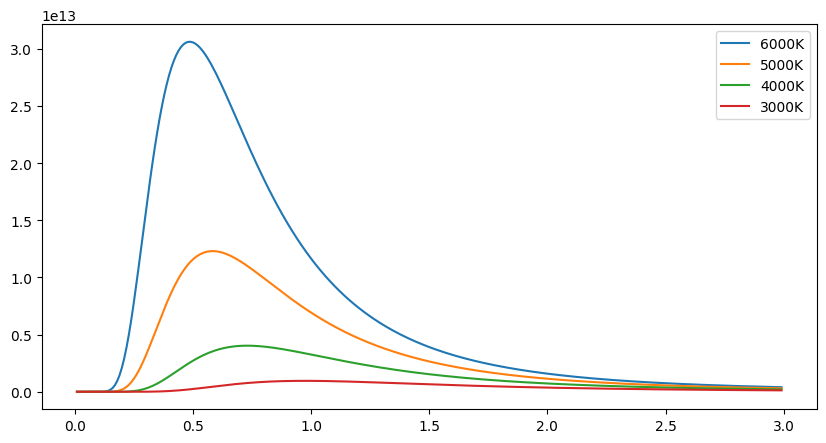

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

plt.rcParams['figure.figsize'] = [10, 5]

c1 = 3.74E-16
c2 = 1.45E-2

T = [6000, 5000, 4000, 3000]

lamda = np.arange(0.01, 3, 0.01)

for t in T:
    b = (c1 * (lamda * 10 ** -6) ** -5) / (np.pi * (np.e ** (c2 / (lamda * 10 ** -6 * t)) - 1))
    la = str(t) + "K"
    plt.plot(lamda, b, label=la)

plt.legend()
plt.show()

In [ ]:
import math

b = 2.897771955E-3

for t in T:
    lambda_peak = b / t
    print(f"Wavelength of peak emission for a black body at {t} K is {lambda_peak} m")

Wavelength of peak emission for a black body at 6000 K is 4.829619925e-07 m
Wavelength of peak emission for a black body at 5000 K is 5.79554391e-07 m
Wavelength of peak emission for a black body at 4000 K is 7.2444298875e-07 m
Wavelength of peak emission for a black body at 3000 K is 9.65923985e-07 m


In [ ]:
sigma = 5.670E-8

boltzmann = [sigma*t**4 for t in T]

for t, e in zip(T, boltzmann):
    print(f"Total energy emitted by a black body at {t} K using Stefan-Boltzmann law is {e:4.0f} W/m^2")

h = 6.626E-34
c = 3E8
k = 1.380649E-23

lamda = np.linspace(4E-7, 1E-6, 1000)

planck = []
for t in T:
    radiance = 2*h*c**2/lamda**5 * 1/(np.exp(h*c/(lamda*k*t))-1)
    planck.append(np.trapz(radiance, lamda))

for t, e in zip(T, planck):
    print(f"Total energy emitted by a black body at {t} K using Planck function is {e:4.0f} W/m^2")

Total energy emitted by a black body at 6000 K using Stefan-Boltzmann law is 73483200 W/m^2
Total energy emitted by a black body at 5000 K using Stefan-Boltzmann law is 35437500 W/m^2
Total energy emitted by a black body at 4000 K using Stefan-Boltzmann law is 14515200 W/m^2
Total energy emitted by a black body at 3000 K using Stefan-Boltzmann law is 4592700 W/m^2
Total energy emitted by a black body at 6000 K using Planck function is 13958355 W/m^2
Total energy emitted by a black body at 5000 K using Planck function is 6385094 W/m^2
Total energy emitted by a black body at 4000 K using Planck function is 2126014 W/m^2
Total energy emitted by a black body at 3000 K using Planck function is 395149 W/m^2


Prac 3

In [ ]:
def solar_flux(s, d):
    return s / (d**2)

s = 1370

data = {
    "Venus": 0.723,
    "Earth": 1.000,
    "Mars": 1.524,
    "Europa": 5.203
}

solar_fluxes = {
    planet: solar_flux(s, d)
    for planet, d in data.items()
}

for planet, flux in solar_fluxes.items():
    print(f"The solar flux for {planet} is {flux:.2f} W/m^2")

The solar flux for Venus is 2620.86 W/m^2
The solar flux for Earth is 1370.00 W/m^2
The solar flux for Mars is 589.86 W/m^2
The solar flux for Europa is 50.61 W/m^2


In [ ]:
import math
sigma = 5.670e-8  # W/(m^2*K^4)

def blackbody_t(flux, albedo):
    t = ((1 - albedo) * flux / (4 * sigma))**(1/4)
    return t

flux = {
    "Venus": 2620.86,
    "Earth": 1370.00,
    "Mars": 589.86,
    "Europa": 50.61
}

albedos = {
    "Venus": 0.76,
    "Earth": 0.32,
    "Mars": 0.16,
    "Europa": 0.64
}

for planet, flux in flux.items():
    albedo = albedos[planet]
    t = blackbody_t(flux, albedo)
    print(f"The black body equivalent temperature for {planet} is {t} K")

The black body equivalent temperature for Venus is 229.48431298446596 K
The black body equivalent temperature for Earth is 253.16088628145764 K
The black body equivalent temperature for Mars is 216.19532352212696 K
The black body equivalent temperature for Europa is 94.67252209502239 K


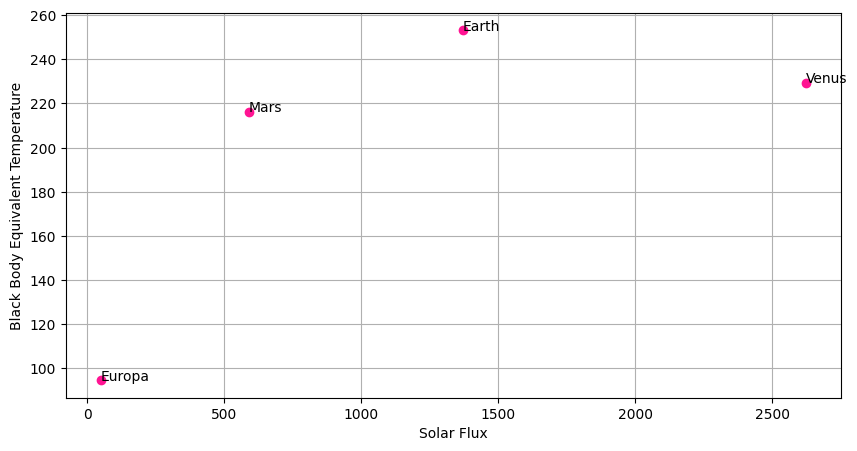

In [ ]:
import matplotlib.pyplot as plt

flux = {"Venus": 2620.86, "Earth": 1370.00, "Mars": 589.86, "Europa": 50.61}
t = {"Venus": 229.48, "Earth": 253.16, "Mars": 216.19, "Europa": 94.67}

plt.figure()
plt.scatter(list(flux.values()), list(t.values()), color = 'deeppink')
plt.xlabel("Solar Flux")
plt.ylabel("Black Body Equivalent Temperature")
for planet in flux:
    plt.annotate(planet, (flux[planet], t[planet]))
plt.grid()
plt.show()

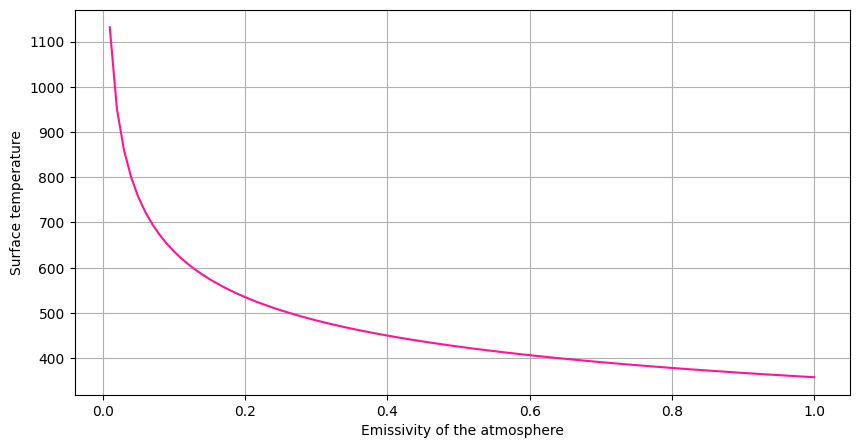

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

S = 1368
sigma = 5.67E-8
albedo = 0.32

epsilon = np.linspace(0.01, 1, 100)

Ts = []
for e in epsilon:
    Ts.append(((1 - albedo) * S / (e * sigma))**(1/4))

plt.figure()
plt.plot(epsilon, Ts, color = 'deeppink')
plt.xlabel("Emissivity of the atmosphere")
plt.ylabel("Surface temperature")
plt.grid()
plt.show()

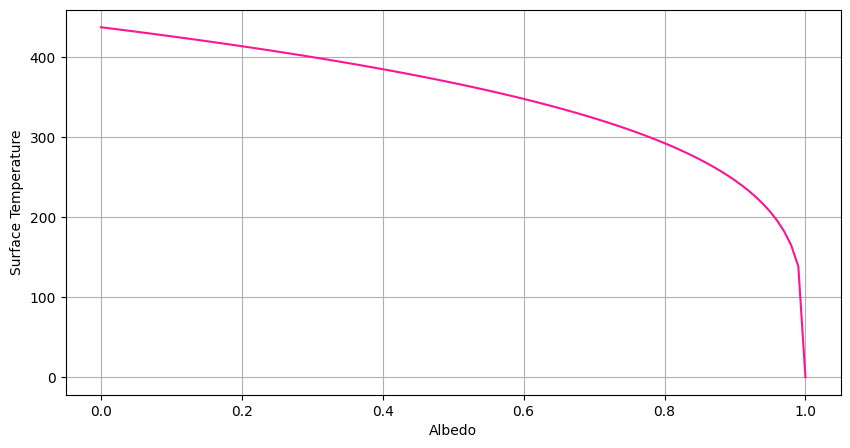

In [ ]:
epsilon = 0.66

alpha = np.linspace(0, 1, 100)
Ts = (S * (1 - alpha) / (epsilon * sigma))**(1/4)

plt.figure()
plt.plot(alpha, Ts, color = 'deeppink')
plt.xlabel('Albedo')
plt.ylabel('Surface Temperature')
plt.grid()
plt.show()

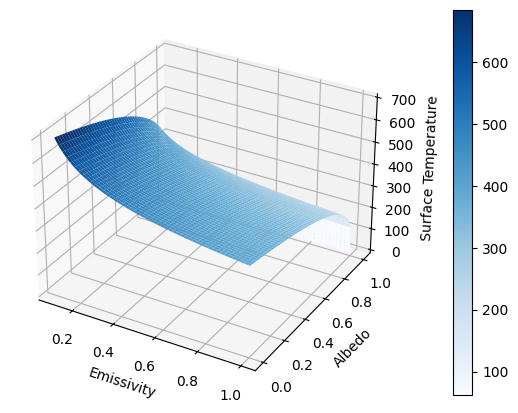

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

epsilon = np.linspace(0.1, 1, 100)
alpha = np.linspace(0, 1, 100)

x, y = np.meshgrid(epsilon, alpha)
Ts = ( S*(1 - y) / (x*sigma) ) ** (1/4)

fig = plt.figure(figsize=(15, 5))
ax = plt.axes(projection='3d')
surf = ax.plot_surface(x, y, Ts, cmap='Blues')

ax.set_xlabel('Emissivity')
ax.set_ylabel('Albedo')
ax.set_zlabel('Surface Temperature')

cbar = fig.colorbar(surf)

plt.show()

**Prac 5**

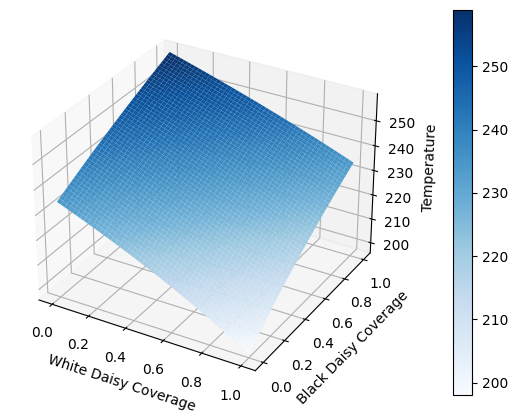

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

L = 1.0
S = 1368
sigma = 5.67E-8
albedo_black = 0.25
albedo_white = 0.75
albedo_surface = 0.5
T_opt = 295
temp_range = 10

def planetary_temperature(w, b, L):
    albedo = w * albedo_white + b * albedo_black + (1 - w - b) * albedo_surface
    return ((L * S * (1 - albedo)) / (4 * sigma)) ** 0.25

def growth_rate(T):
    return max(0, 1 - ((T - T_opt) / temp_range) ** 2)

def simulate_daisy_world(w, b):
    T = planetary_temperature(w, b, L)
    f_w = growth_rate(T)
    f_b = growth_rate(T)
    dw_dt = f_w * w * (1 - (w + b))
    db_dt = f_b * b * (1 - (w + b))
    return T, dw_dt, db_dt

w_range = np.linspace(0, 1, 50)
b_range = np.linspace(0, 1, 50)
w, b = np.meshgrid(w_range, b_range)

T = np.zeros_like(w)
for i in range(len(w_range)):
    for j in range(len(b_range)):
        T[i, j], _, _ = simulate_daisy_world(w[i, j], b[i, j])

fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(111, projection='3d')
surf = ax.plot_surface(w, b, T, cmap='Blues')

ax.set_xlabel('White Daisy Coverage')
ax.set_ylabel('Black Daisy Coverage')
ax.set_zlabel('Temperature')

cbar = fig.colorbar(surf)

plt.show()

In [ ]:
S0 = 1000
b = 0.2
w = 0.2

epsilon = 0.3
q = 20
k = 0.003265
T0 = 22.5
d = 0.3
sigma = 5.67e-8
alpha_black = 0.25
alpha_white = 0.75
alpha_ground = 0.5

eps = 1
eps_ref = 1E-8

while eps > eps_ref:
    x = 1-b- w
    alpha = b*alpha_black + w*alpha_white + x*alpha_ground
    Te = ((1-albedo)*S0 / (4*epsilon*sigma)) ** (1/4) - 273.15
    T_black = Te+(albedo-alpha_black)
    T_white = Te+(albedo-alpha_white)
    f_black = max(0,1-k*(T0-T_black) ** 2)
    f_white = max(0,1-k*(T0-T_white) ** 2)
    db = b*(x*f_black-d)
    dw = w*(x*f_white-d)
    b = b+db
    w = w+dw

    eps = abs(db+dw)

print("Equilibrium value of b is:", b)
print("Equilibrium value of w is:", w)

Equilibrium value of b is: 0.3500872084464622
Equilibrium value of w is: 0.3498501488641292


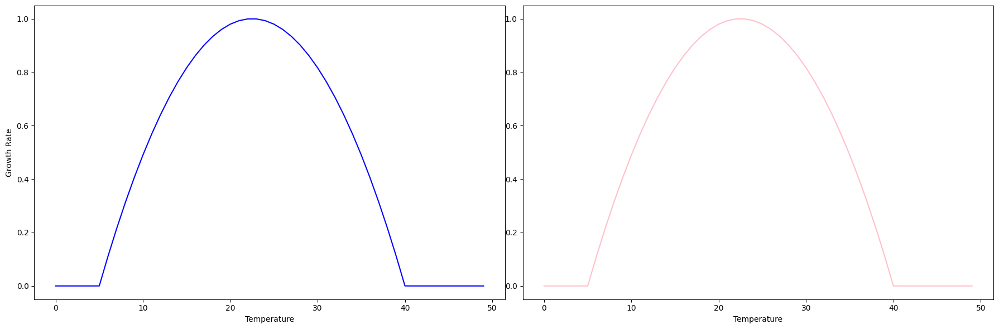

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

k = 0.003265
T0 = 22.5
T = np.arange(0, 50, 1)

fb_array = []
fw_array = []

for i in T:
    fb = max(0, 1 - k * (T0 - i) ** 2)
    fb_array.append(fb)
    fw = max(0, 1 - k * (T0 - i) ** 2)
    fw_array.append(fw)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 6))

ax1.plot(T, fb_array, color='blue')
ax1.set_xlabel("Temperature")
ax1.set_ylabel("Growth Rate")

ax2.plot(T, fw_array, color='pink')
ax2.set_xlabel("Temperature")
plt.tight_layout(w_pad=0)

plt.show()

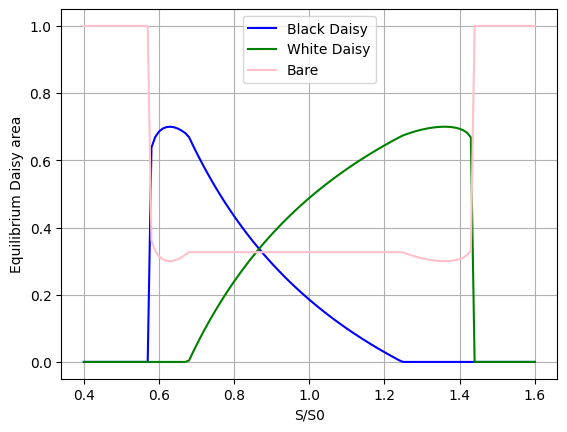

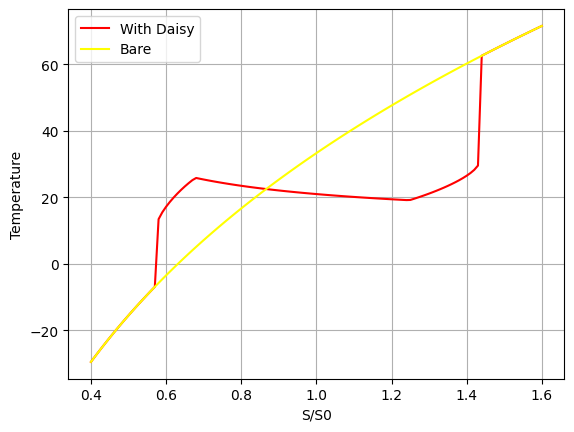

In [ ]:
sigma = 5.6696e-8
epsilon = 0.3
d = 0.3
s0 = 1000
alb_white = 0.75
alb_black = 0.25
alb_bare = 0.5
q = 20
eps_ref = 1e-8
T0 = 22.5
k = 0.003265
a_ini_white = 0.2
a_ini_black = 0.2
mf_it = 0.01
ns = 121

sol_flx_fnl = np.zeros(ns)
a_bare_fnl = np.zeros(ns)
a_black_fnl = np.zeros(ns)
a_white_fnl = np.zeros(ns)
tem_ini_fnl = np.zeros(ns)
tem_pln_fnl = np.zeros(ns)
fw_fnl = []
fb_fnl = []
tmp_b = []
tmp_w = []

ilogic = 1
while ilogic != 0:
    a_black = a_ini_black
    a_white = a_ini_white
    if ilogic == 1:
        irange = range(int(ns/2), ns, 1)
    elif ilogic == -1:
        irange = range(int(ns/2), -1, -1)
    for i in irange:
        mf = 1 + (i - int(ns/2)) * mf_it
        sol_flx = s0 * mf
        eps = 1.0

        while eps > eps_ref:
            a_bare = 1 - a_black - a_white
            alb_pln = a_bare * alb_bare + a_black * alb_black + a_white * alb_white
            tem_pln = (sol_flx * (1 - alb_pln) / sigma) ** (1/4) - 273.15
            tem_black = tem_pln + q * (alb_pln - alb_black)
            tem_white = tem_pln + q * (alb_pln - alb_white)
            fb = max(0., 1 - k * (T0 - tem_black) ** 2)
            fw = max(0., 1 - k * (T0 - tem_white) ** 2)
            if -10. <= tem_black <= 70. and fb >= 0:
                tmp_b.append(tem_black)
                fb_fnl.append(fb)
            if -10. <= tem_white <= 70. and fw >= 0:
                tmp_w.append(tem_white)
                fw_fnl.append(fw)
            db_dt = a_black * (a_bare * fb - d)
            dw_dt = a_white * (a_bare * fw - d)
            a_black = a_black + db_dt
            a_white = a_white + dw_dt
            eps = abs(db_dt) + abs(dw_dt)
            sol_flx_fnl[i] = mf
            a_bare_fnl[i] = a_bare
            a_black_fnl[i] = a_black
            a_white_fnl[i] = a_white
            tem_ini_fnl[i] = (sol_flx * (1 - alb_bare) / sigma) ** (1/4) - 273.15
            tem_pln_fnl[i] = tem_pln
    if ilogic == 1:
        ilogic = -1
    else:
        ilogic = 0

fig = plt.figure()
plt.plot(sol_flx_fnl, a_black_fnl, 'blue', label="Black Daisy")
plt.plot(sol_flx_fnl, a_white_fnl, 'green', label='White Daisy')
plt.plot(sol_flx_fnl, a_bare_fnl, 'pink', label="Bare")
plt.legend(loc='upper center')
plt.xlabel("S/S0")
plt.ylabel("Equilibrium Daisy area")
plt.grid(True)

fig = plt.figure()
plt.plot(sol_flx_fnl, tem_pln_fnl, 'red', label="With Daisy")
plt.plot(sol_flx_fnl, tem_ini_fnl, 'yellow', label="Bare")
plt.legend()
plt.xlabel("S/S0")
plt.ylabel("Temperature")
plt.grid(True)

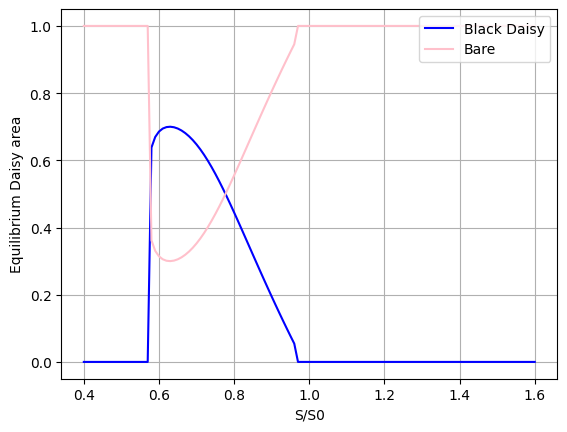

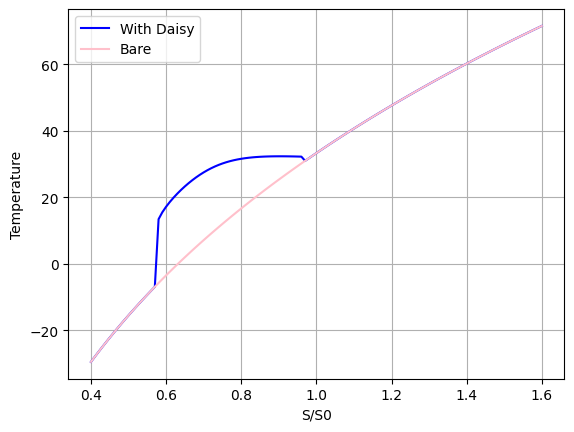

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

sigma = 5.6696E-8
epsilon = 0.3
d = 0.3
s0 = 1000
alb_black = 0.25
alb_bare = 0.5
q = 20
eps_ref = 1e-8
T0 = 22.5
k = 0.003265
a_ini_black = 0.4
mf_it = 0.01
ns = 121

sol_flx_fnl = np.zeros(ns)
a_bare_fnl = np.zeros(ns)
a_black_fnl = np.zeros(ns)
tem_ini_fnl = np.zeros(ns)
tem_pln_fnl = np.zeros(ns)
fb_fnl = []
tmp_b = []

ilogic = 1
while ilogic != 0:
    a_black = a_ini_black
    if ilogic == 1:
        irange = range(int(ns/2), ns, 1)
    elif ilogic == -1:
        irange = range(int(ns/2), -1, -1)
    for i in irange:
        mf = 1 + (i - int(ns/2)) * mf_it
        sol_flx = s0 * mf
        eps = 1.0

        while eps > eps_ref:
            a_bare = 1 - a_black
            alb_pln = a_bare * alb_bare + a_black * alb_black
            tem_pln = (sol_flx * (1 - alb_pln) / sigma) ** (1/4) - 273.15
            tem_black = tem_pln + q * (alb_pln - alb_black)
            fb = max(0., 1 - k * (T0 - tem_black) ** 2)
            if -10. <= tem_black <= 70. and fb >= 0:
                tmp_b.append(tem_black)
                fb_fnl.append(fb)
            db_dt = a_black * (a_bare * fb - d)
            a_black = a_black + db_dt
            eps = abs(db_dt)
            sol_flx_fnl[i] = mf
            a_bare_fnl[i] = a_bare
            a_black_fnl[i] = a_black
            tem_ini_fnl[i] = (sol_flx * (1 - alb_bare) / sigma) ** (1/4) - 273.15
            tem_pln_fnl[i] = tem_pln
    if ilogic == 1:
        ilogic = -1
    else:
        ilogic = 0

fig = plt.figure()
plt.plot(sol_flx_fnl, a_black_fnl, 'blue', label="Black Daisy")
plt.plot(sol_flx_fnl, a_bare_fnl, 'pink', label="Bare")
plt.legend(loc='upper right')
plt.xlabel("S/S0")
plt.ylabel("Equilibrium Daisy area")
plt.grid(True)

fig = plt.figure()
plt.plot(sol_flx_fnl, tem_pln_fnl, 'blue', label="With Daisy")
plt.plot(sol_flx_fnl, tem_ini_fnl, 'pink', label="Bare")
plt.legend()
plt.xlabel("S/S0")
plt.ylabel("Temperature")
plt.grid(True)

Prac 6

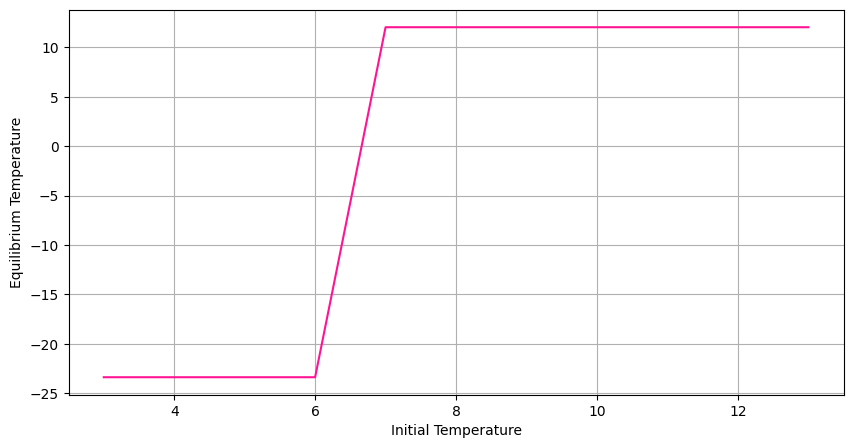

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

alpha_ice = 0.6
alpha_land = 0.32
epsilon = 0.62
T_ice = -10
T_land = 10
S0 = 1368
sigma = 5.67E-8

def albedo(T):
    if T < T_ice:
        return alpha_ice
    elif T > T_land:
        return alpha_land
    else:
        return alpha_ice + (alpha_land - alpha_ice) * (T - T_ice) / (T_land - T_ice)

def equilibrium_t(T_initial, S=S0):
    T_current = T_initial + 273.15
    T_next = T_current
    while True:
        alpha = albedo(T_current - 273.15)
        T_next = ((S * (1 - alpha)) / (4 * sigma * epsilon)) ** 0.25
        if abs(T_next - T_current) < 0.01:
            break
        T_current = T_next
    return T_next - 273.15

initial_ts = np.arange(3, 14, 1)
equilibrium_ts = [equilibrium_t(T) for T in initial_ts]

plt.figure(figsize=(10, 5))
plt.plot(initial_ts, equilibrium_ts, color = 'deeppink')
plt.xlabel('Initial Temperature')
plt.ylabel('Equilibrium Temperature')
plt.grid(True)
plt.show()

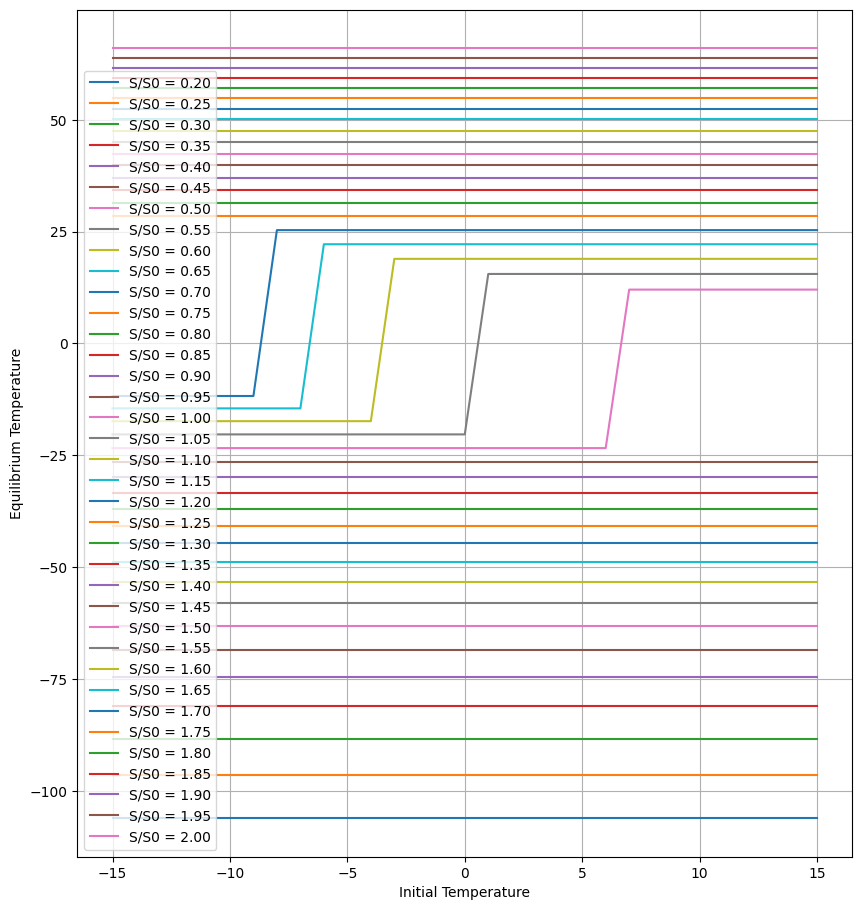

In [ ]:
initial_ts = np.arange(-15, 16, 1)
solar_flux_ratios = np.arange(0.2, 2.05, 0.05)

plt.figure(figsize=(10, 11))
for S_ratio in solar_flux_ratios:
    S = S_ratio * S0
    equilibrium_ts = [equilibrium_t(T, S) for T in initial_ts]
    plt.plot(initial_ts, equilibrium_ts, label=f"S/S0 = {S_ratio:.2f}")

plt.xlabel('Initial Temperature')
plt.ylabel('Equilibrium Temperature')
plt.legend()
plt.grid(True)
plt.show()

**Prac 7**

Number of iterations to reach equilibrium: 5
Band 0 4.694 19.6064
Band 1 4.694 19.773
Band 2 4.694 18.3183
Band 3 4.694 13.6965
Band 4 4.694 6.7701
Band 5 4.694 0.644
Band 6 4.694 -11.4616
Band 7 4.694 -14.3208
Band 8 4.694 -15.7026


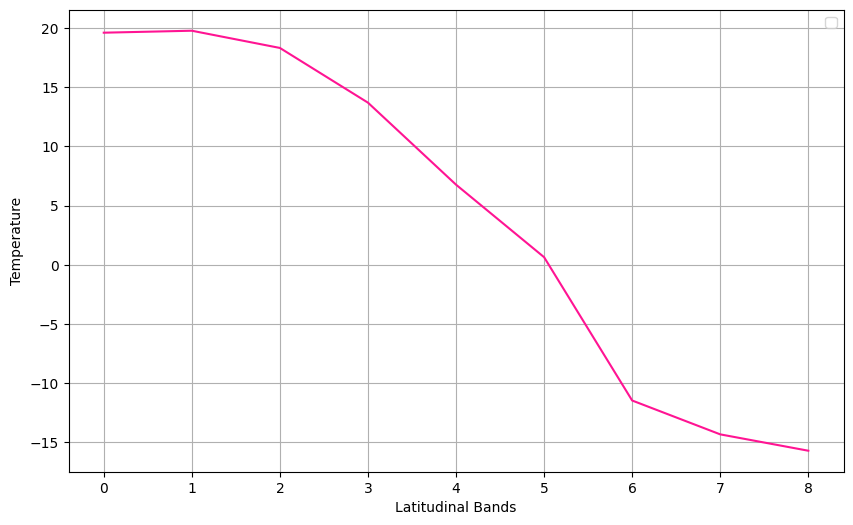

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

a = 204
b = 2.17
k = 3.81
so0 = 1369
albi = 0.6
tc1 = -10
tc2 = 0
ny = 9
it = 25

alb0 = [0.23, 0.24, 0.25, 0.29, 0.35, 0.4, 0.46, 0.5, 0.5]
so = np.zeros(ny)
so_frac = [0.30475, 0.29725, 0.28, 0.25525, 0.223, 0.1925, 0.156, 0.13275, 0.125]

phi = np.zeros(ny)
phid = np.zeros(ny)
area = np.zeros(ny)
alb = np.zeros(ny)
tj = np.zeros(ny)
tj_ini = np.zeros(ny)
tj_pre = np.zeros(ny)

dp = np.pi / (2 * ny)
for j in range(ny):
    phi[j] = (0.5 + j - 1) * dp
    phid[j] = phi[j] * 180 / np.pi
    area[j] = np.sin(phi[j] + dp / 2.) - np.sin(phi[j] - dp / 2.)
    so[j] = so0 * so_frac[j]

albm = 0.0
for j in range(ny):
    albm += alb0[j] * area[j]

tm = ((so0 / 4) * (1 - albm) - a) / b

for j in range(ny):
    tj_ini[j] = tm
    tj_pre[j] = tm
    tj[j] = tm

epsilon = 1E-6
diff = 1

i = 0
while abs(diff) > epsilon:
    i += 1
    albm = 0
    tm = 0
    diff = 0
    for j in range(ny):
        if tj[j] < tc1:
            ice = 1
        elif tj[j] > tc2:
            ice = 0
        else:
            ice = (tc2 - tj[j]) / (tc2 - tc1)
        alb[j] = ice * albi + (1 - ice) * alb0[j]
        tj[j] = (so[j] * (1 - alb[j]) + k * tm - a) / (b + k)
        albm += alb[j] * area[j]
        tm += tj[j] * area[j]
        diff += tj[j] - tj_pre[j]
        tj_pre[j] = tj[j]

print("Number of iterations to reach equilibrium:", i)
for j in range(ny):
    print('Band', j, np.round(tj_ini[j], 4), np.round(tj[j], 4))

plt.figure(figsize=(10, 6))
plt.plot(range(ny), tj, color = 'deeppink')
plt.xlabel('Latitudinal Bands')
plt.ylabel('Temperature')
plt.legend()
plt.grid(True)
plt.show()

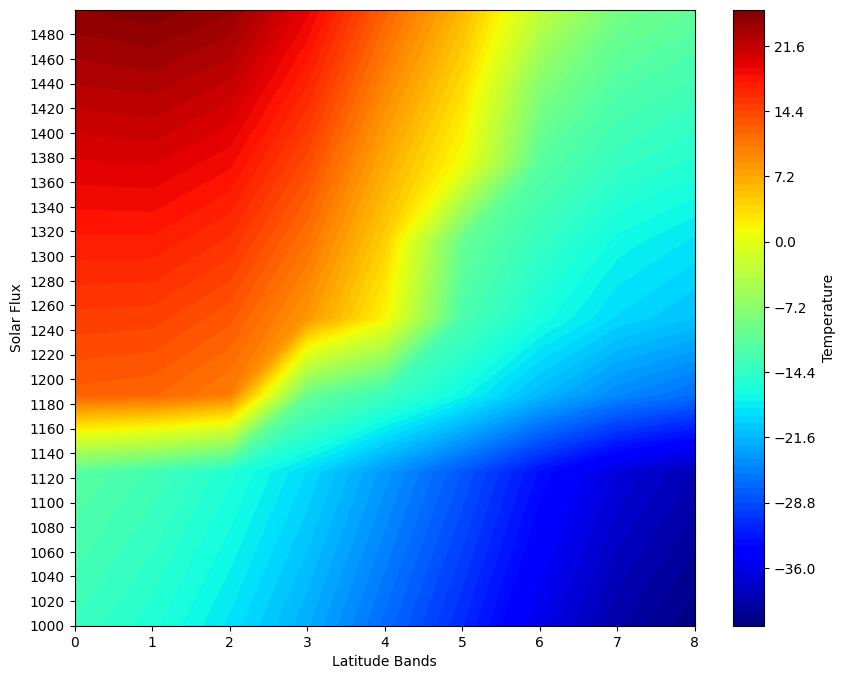

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

a = 204
b = 2.17
k = 3.81
albi = 0.6
tc1 = -10
tc2 = 0
ny = 9

alb0 = [0.23, 0.24, 0.25, 0.29, 0.35, 0.40, 0.46, 0.5, 0.5]
so_frac = [0.30475, 0.29725, 0.28, 0.25525, 0.223, 0.1925, 0.156, 0.13275, 0.125]

phi = np.zeros(ny)
area = np.zeros(ny)
dp = np.pi / (2 * ny)
for j in range(ny):
    phi[j] = (0.5 + j - 1) * dp
    area[j] = np.sin(phi[j] + dp / 2.) - np.sin(phi[j] - dp / 2.)

def calculate_temperatures(so0):
    so = so0 * np.array(so_frac)

    albm = sum(alb0[j] * area[j] for j in range(ny))
    tm = ((so0 / 4.0) * (1 - albm) - a) / b

    tj = np.full(ny, tm)
    tj_pre = np.full(ny, tm)

    epsilon = 1E-6
    diff = 1

    while abs(diff) > epsilon:
        albm = 0
        tm = 0
        diff = 0
        for j in range(ny):
            if tj[j] < tc1:
                ice = 1
            elif tj[j] > tc2:
                ice = 0
            else:
                ice = (tc2 - tj[j]) / (tc2 - tc1)
            alb = ice * albi + (1 - ice) * alb0[j]
            tj[j] = (so[j] * (1 - alb) + k * tm - a) / (b + k)
            albm += alb * area[j]
            tm += tj[j] * area[j]
            diff += tj[j] - tj_pre[j]
            tj_pre[j] = tj[j]

    return tj

so_range = np.linspace(1000, 1500, 9)

temperature_matrix = np.zeros((len(so_range), ny))

for i, so0 in enumerate(so_range):
    temperature_matrix[i, :] = calculate_temperatures(so0)

plt.figure(figsize=(10, 8))
plt.contourf(range(ny), so_range, temperature_matrix, cmap = 'jet', levels=100)
plt.colorbar(label='Temperature')
plt.xlabel('Latitude Bands')
plt.ylabel('Solar Flux')
y_ticks = np.arange(1000, 1500, 20)
plt.yticks(y_ticks)

plt.show()

<ipython-input-52-638205f6f225>:71: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(Budyko[1],Budyko[0],'k', color = 'blue', label='3.81')
<ipython-input-52-638205f6f225>:72: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "y" (-> color=(0.75, 0.75, 0.0, 1)). The keyword argument will take precedence.
  plt.plot(Warren_Schneider[1],Warren_Schneider[0],'y', color = 'pink', label='3.74')


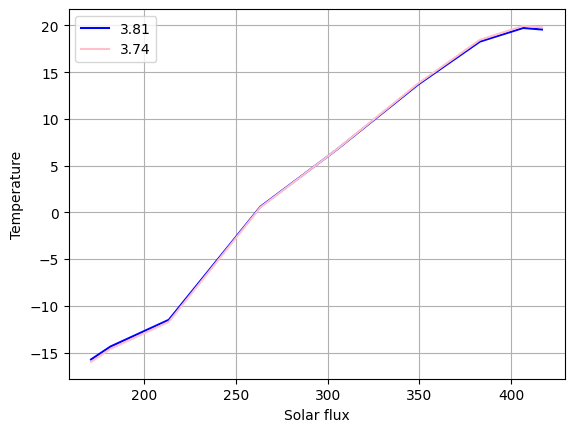

In [ ]:
def EBM_1D(a,b,k):
    so0=1368
    albi=0.6
    tc1=-10
    tc2=0
    ny=9
    it=25

    alb0=[0.23, 0.24, 0.25, 0.29, 0.35, 0.40, 0.46, 0.5, 0.5]
    so=np.zeros(ny)
    so_frac=[0.30475,0.29725,0.28,0.25525,0.223,0.1925,0.156,0.13275,0.125]

    phi=np.zeros(ny)
    phid=np.zeros(ny)
    area=np.zeros(ny)
    alb=np.zeros(ny)
    tj=np.zeros(ny)
    tj_ini=np.zeros(ny)
    tj_pre=np.zeros(ny)

    dp=np.pi/(2*ny)
    for j in range(0, ny):
        phi[j]=(0.5+j-1)*dp
        phid[j]=phi[j]*180/np.pi
        area[j]=np.sin(phi[j]+dp/2.)-np.sin(phi[j]-dp/2.)
        so[j]=so0*so_frac[j]

    albm=0.0
    for j in range(0,ny):
        albm=albm+alb0[j]*area[j]

    tm=((so0/4)*(1-albm)-a)/b

    for j in range(0,ny):
        tj_ini[j]=tm
        tj_pre[j]=tm
        tj[j]=tm

    epsilon=1.0*(10**(-6))
    diff=1.

    i=0
    while abs(diff)>epsilon:
        i=i+1
        albm=0.
        tm=0.
        diff=0.
        for j in range(0,ny):
            if tj[j]<tc1:
                ice=1
            elif tj[j]>tc2:
                ice=0
            else:
                ice=(tc2-tj[j])/(tc2-tc1)
            alb[j]=ice*albi+(1-ice)*alb0[j]
            tj[j]=(so[j]*(1-alb[j])+k*tm-a)/(b+k)
            albm=albm+alb[j]*area[j]
            tm=tm+tj[j]*area[j]
            diff=diff+tj[j]-tj_pre[j]
            tj_pre[j]=tj[j]
    return(tj,so)

a=204
b=2.17
k_Budyko=3.81
k_Warren=3.74

Budyko=EBM_1D(a,b,k_Budyko)
Warren_Schneider=EBM_1D(a,b,k_Warren)

plt.plot(Budyko[1],Budyko[0],'k', color = 'blue', label='3.81')
plt.plot(Warren_Schneider[1],Warren_Schneider[0],'y', color = 'pink', label='3.74')

plt.legend()
plt.xlabel("Solar flux")
plt.ylabel("Temperature")
plt.grid("True")

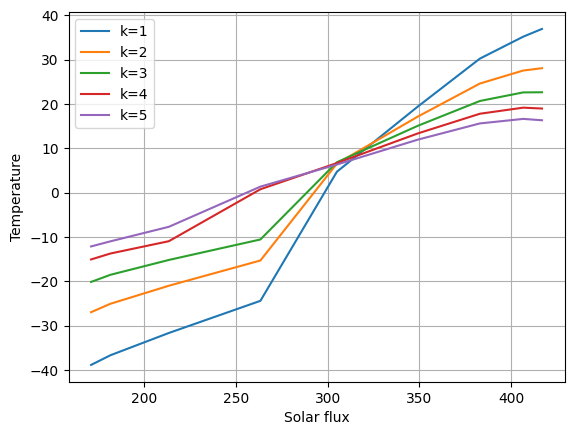

In [ ]:
k=np.arange(1,6,1)

for i in range(len(k)):
    temp_fin,so_flux=EBM_1D(a,b,k[i])
    plt.plot(so_flux,temp_fin,label= 'k='+str(k[i]))

plt.legend()
plt.xlabel("Solar flux")
plt.ylabel("Temperature")
plt.grid("True")

<ipython-input-67-f12114f04c50>:74: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "k" (-> color=(0.0, 0.0, 0.0, 1)). The keyword argument will take precedence.
  ax.plot(Budyko2[1], Budyko2[0], 'k', color='blue', label='Budyko')
<ipython-input-67-f12114f04c50>:75: UserWarning: color is redundantly defined by the 'color' keyword argument and the fmt string "y" (-> color=(0.75, 0.75, 0.0, 1)). The keyword argument will take precedence.
  ax.plot(Cess[1], Cess[0], 'y', color='pink', label='Cess')


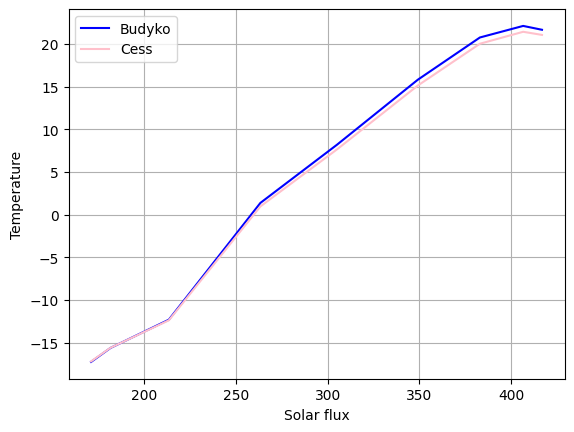

In [ ]:
def EBM_1D(a,b,k):
    so0=1368
    albi=0.6
    tc1=-10
    tc2=0
    ny=9
    it=25

    alb0=[0.23, 0.24, 0.25, 0.29, 0.35, 0.40, 0.46, 0.5, 0.5]
    so=np.zeros(ny)
    so_frac=[0.30475,0.29725,0.28,0.25525,0.223,0.1925,0.156,0.13275,0.125]

    phi=np.zeros(ny)
    phid=np.zeros(ny)
    area=np.zeros(ny)
    alb=np.zeros(ny)
    tj=np.zeros(ny)
    tj_ini=np.zeros(ny)
    tj_pre=np.zeros(ny)

    dp=np.pi/(2*ny)
    for j in range(0, ny):
        phi[j]=(0.5+j-1)*dp
        phid[j]=phi[j]*180/np.pi
        area[j]=np.sin(phi[j]+dp/2.)-np.sin(phi[j]-dp/2.)
        so[j]=so0*so_frac[j]

    albm=0.0
    for j in range(0,ny):
        albm=albm+alb0[j]*area[j]

    tm=((so0/4)*(1-albm)-a)/b

    for j in range(0,ny):
        tj_ini[j]=tm
        tj_pre[j]=tm
        tj[j]=tm

    epsilon=1.0*(10**(-6))
    diff=1.

    i=0
    while abs(diff)>epsilon:
        i=i+1
        albm=0.
        tm=0.
        diff=0.
        for j in range(0,ny):
            if tj[j]<tc1:
                ice=1
            elif tj[j]>tc2:
                ice=0
            else:
                ice=(tc2-tj[j])/(tc2-tc1)
            alb[j]=ice*albi+(1-ice)*alb0[j]
            tj[j]=(so[j]*(1-alb[j])+k*tm-a)/(b+k)
            albm=albm+alb[j]*area[j]
            tm=tm+tj[j]*area[j]
            diff=diff+tj[j]-tj_pre[j]
            tj_pre[j]=tj[j]
    return(tj,so)

k = 3.81
A = 207
B_Budyko = 1.45
B_Cess = 1.6

Budyko2 = EBM_1D(A, B_Budyko, k)
Cess = EBM_1D(A, B_Cess, k)

fig = plt.figure()
ax = fig.add_subplot(1, 1, 1)

ax.plot(Budyko2[1], Budyko2[0], 'k', color='blue', label='Budyko')
ax.plot(Cess[1], Cess[0], 'y', color='pink', label='Cess')

ax.legend()
ax.set_xlabel("Solar flux")
ax.set_ylabel("Temperature")
ax.grid("True")

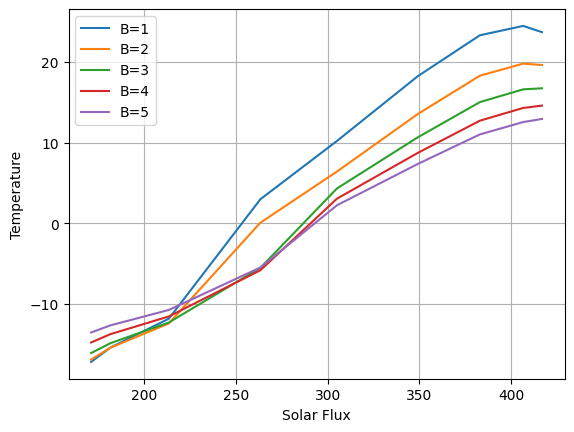

In [ ]:
k = 3.81
A = 207
B = np.arange(1, 6, 1)

fig, ax = plt.subplots()

for i in range(len(B)):
    temp_fin,so_flux=EBM_1D(A,B[i],k)
    plt.plot(so_flux,temp_fin,label= 'B=' + str(np.round(B[i],1)))

ax.set_xlabel('Solar Flux')
ax.set_ylabel('Temperature')
ax.legend()
ax.grid("True")

plt.show()

**Prac 9**

In [ ]:
import xarray as xr

data = xr.open_dataset('/content/drive/MyDrive/sst.mnmean.nc')
print(data)

<xarray.Dataset>
Dimensions:    (lat: 180, lon: 360, time: 494, nbnds: 2)
Coordinates:
  * lat        (lat) float32 89.5 88.5 87.5 86.5 ... -86.5 -87.5 -88.5 -89.5
  * lon        (lon) float32 0.5 1.5 2.5 3.5 4.5 ... 356.5 357.5 358.5 359.5
  * time       (time) datetime64[ns] 1981-12-01 1982-01-01 ... 2023-01-01
Dimensions without coordinates: nbnds
Data variables:
    sst        (time, lat, lon) float32 ...
    time_bnds  (time, nbnds) datetime64[ns] ...
Attributes:
    title:          NOAA Optimum Interpolation (OI) SST V2
    Conventions:    CF-1.0
    history:        Wed Apr  6 13:47:45 2005: ncks -d time,0,278 SAVEs/sst.mn...
    comments:       Data described in  Reynolds, R.W., N.A. Rayner, T.M.\nSmi...
    platform:       Model
    source:         NCEP Climate Modeling Branch
    institution:    National Centers for Environmental Prediction
    References:     https://www.psl.noaa.gov/data/gridded/data.noaa.oisst.v2....
    dataset_title:  NOAA Optimum Interpolation (OI) SST V

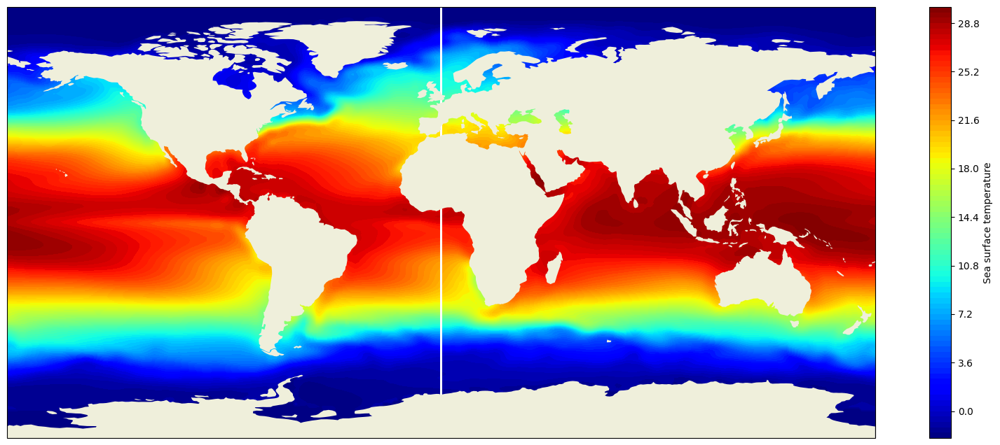

In [ ]:
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

data = xr.open_dataset('/content/drive/MyDrive/sst.mnmean.nc')

sst = data['sst']
time = data['time']

sst_mean = sst.mean(dim=['lat', 'lon'])

sst_mean_global = sst.mean(dim='time')
fig, ax = plt.subplots(figsize = (20, 8),subplot_kw={'projection': ccrs.PlateCarree()})

im = ax.contourf(sst['lon'], sst['lat'], sst_mean_global, cmap='jet', levels=100, transform=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND, zorder=1)
plt.colorbar(im, ax=ax, label='Sea surface temperature')
plt.show()

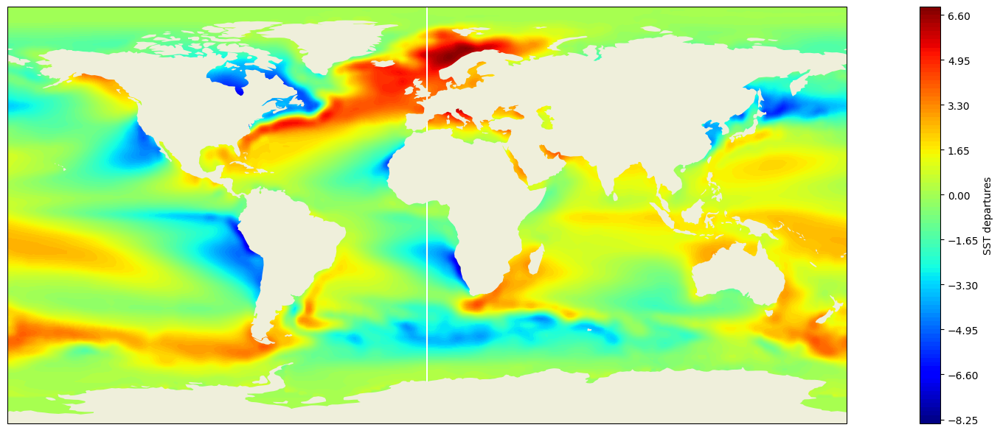

In [ ]:
import numpy as np
import netCDF4 as nc
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature

fh = nc.Dataset('/content/drive/MyDrive/sst.mnmean.nc', 'r')

lat = fh.variables['lat'][:].data
long = fh.variables['lon'][:].data

sst_average = np.mean(sst, axis=(2))
sst_departure = sst - np.expand_dims(sst_average, axis=(2))

max_abs_value = np.max(np.abs(sst_departure))

fig = plt.figure(figsize = (20, 6))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

im = ax.contourf(long, lat, np.mean(sst_departure, axis=0), cmap='jet', levels = 100, transform=ccrs.PlateCarree())

ax.add_feature(cfeature.LAND, zorder=1)

cbar = fig.colorbar(im, ax=ax, label='SST departures')

plt.tight_layout()
plt.show()

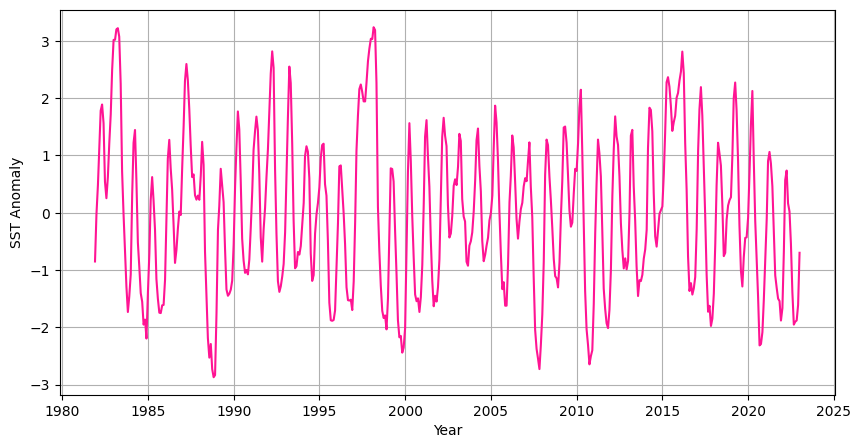

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import netCDF4 as nc
from netCDF4 import Dataset
import datetime as dt

data = Dataset('/content/drive/MyDrive/sst.mnmean.nc', 'r')

lats = data.variables['lat'][:]
lons = data.variables['lon'][:]
times = data.variables['time'][:]
sst = data.variables['sst'][:]
units = data.variables['time'].units

d_times = nc.num2date(times, units, only_use_cftime_datetimes=False, only_use_python_datetimes=True)

latidx_nino3 = (lats >= -5.) & (lats <= 5.)
lonidx_nino3 = (lons >= 210.) & (lons <= 270.)
sst_nino3 = sst[:, latidx_nino3][:, :, lonidx_nino3]

nino3 = np.mean(sst_nino3, axis=(1, 2)) - np.mean(sst_nino3)

plt.figure(figsize=(10, 5))

plt.plot(d_times, nino3, color = 'deeppink')
plt.xlabel('Year')
plt.ylabel('SST Anomaly')
plt.grid()
plt.show()

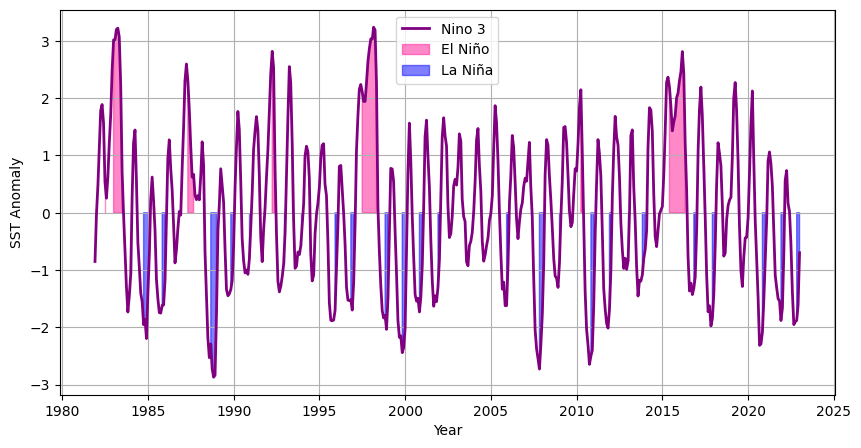

In [ ]:
el_nino_threshold = 0.5
la_nina_threshold = -0.5

el_nino_mask = np.convolve(nino3 >= el_nino_threshold, np.ones(5), mode='valid') == 5
el_nino_mask = np.concatenate((np.zeros(4, dtype=bool), el_nino_mask))

la_nina_mask = np.convolve(nino3 <= la_nina_threshold, np.ones(5), mode='valid') == 5
la_nina_mask = np.concatenate((np.zeros(4, dtype=bool), la_nina_mask))

plt.figure(figsize=(10, 5))

plt.plot(d_times, nino3, color="purple", linewidth=2, label="Nino 3")
plt.fill_between(d_times, nino3, where=el_nino_mask, color="deeppink", alpha=0.5, label="El Niño")
plt.fill_between(d_times, nino3, where=la_nina_mask, color="blue", alpha=0.5, label="La Niña")

plt.xlabel('Year')
plt.ylabel('SST Anomaly')
plt.legend()
plt.grid()
plt.show()

Prac 10

In [ ]:
with open('qbo.dat', 'r') as file:
    lines = file.readlines()

    for _ in range(7):
        lines.pop(0)

    for line in lines:
        print(line.strip())


IIIII YYMM  70hPaN 50hPaN 40hPaN 30hPaN 20hPaN 15hPaN 10hPaN
91700 5301   -60 0   40 0  150 0  220 0  100 0   10 0
91700 5302    -2 0   60 0  180 0  210 0   40 0  -60 0
91700 5303    50 0   75 0  175 0  190 0  -10 0 -100 0
91700 5304    75 0   90 0  170 0  140 0  -60 0 -160 0
91700 5305    95 0  110 0  185 0  110 0 -120 0 -210 0
91700 5306   135 5  164 5  165 0   80 0 -170 0 -220 0
91700 5307   110    155    111     70 0 -200 0 -240 0
91700 5308    75 3  130 0  110 0   50 0 -210 0 -260 0
91700 5309    22    122 7  123 5   28 1 -223 1 -260 0
91700 5310    70    112     79 7   10 0 -220 0 -255 0
91700 5311   125 5  158 2  135 2  -15 2 -225 0 -250 0
91700 5312   115 3  190 2  160 0  -60 0 -230 0 -245 0
91700 5401    50 0   80    100 0 -110 0 -240 0 -240 0
91700 5402     1     30      2 0 -160 0 -250 0 -235 0
91700 5403    45     60    -50 0 -200 0 -260 0 -230 0
91700 5404    55    -30   -120 0 -220 0 -275 0 -220 0
91700 5405    60   -100   -180 0 -235   -240 0 -210 0
91700 5406    55   -

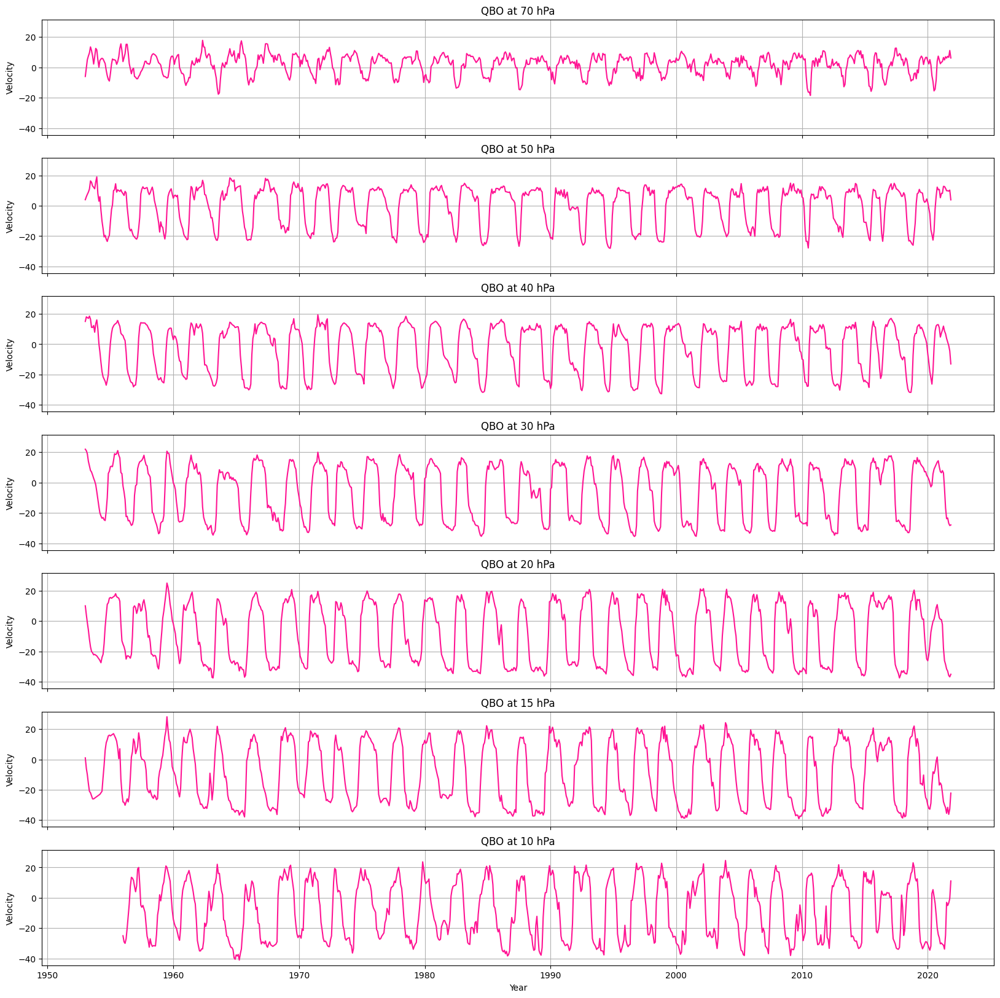

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

qbo = pd.read_fwf('qbo.dat', skiprows=9, header=None)

time = np.asarray(qbo[1])
year = time // 100
year += np.where(year >= 53, 1900, 2000)
month = time % 100

datetime_series = pd.to_datetime({'year': year, 'month': month, 'day': 1})

df_qbo = qbo.drop([0, 1], axis=1) * 0.1
df_qbo.columns = ['70 hPa', 'N', '50 hPa', 'N', '40 hPa', 'N', '30 hPa', 'N', '20 hPa', 'N', '15 hPa', 'N', '10 hPa', 'N']

location = np.empty_like(year, dtype='U15')
location[qbo[0] == 91700] = 'CANTON ISLAND'
location[qbo[0] == 43599] = 'GAN / MALEDIVES'
location[(qbo[0] == 48694) | (qbo[0] == 48698)] = 'SINGAPORE'

fig, ax = plt.subplots(7, 1, figsize=(20, 20), sharex=True, sharey=True)
pressure_levels = ['70 hPa', '50 hPa', '40 hPa', '30 hPa', '20 hPa', '15 hPa', '10 hPa']

for i, level in enumerate(pressure_levels):
    ax[i].plot(datetime_series, df_qbo[level], color='deeppink')
    ax[i].set_ylabel("Velocity")
    ax[i].set_title("QBO at {}".format(level))
    ax[i].grid(True)

plt.xlabel("Year")
plt.grid(True)
plt.show()

In [ ]:
with open('singapore.dat', 'r') as file:
    lines = file.readlines()

    for _ in range(3):
        lines.pop(0)

    for line in lines:
        print(line.strip())

1987
hPa  JAN  FEB  MAR  APR  MAY  JUN  JUL  AUG  SEP  OCT  NOV  DEC
10  -164 -167 -144  -35  116   82   45  116  140  144  116  145
12  -300 -336 -325 -125   74   69   79  153  162  155  130  141
15  -374 -356 -331 -350  -45   60  108  145  145  139  147  106
20  -326 -307 -311 -328 -295  -11   93  124  145  133  124   86
25  -289 -280 -309 -303 -289 -152   21  112  165  128   93   58
30  -260 -266 -271 -270 -268 -247  -63   92  138  117   77   57
35  -192 -209 -219 -244 -283 -367 -179   43  131  124   86   70
40   -86 -113 -171 -236 -266 -273 -281  -14   91  113   93   78
45   -18  -21  -72 -188 -248 -293 -311  -85   48  114   82   76
50    39   32   19  -74 -192 -231 -267 -224  -62   68   83   66
60   102   87   73   51  -12 -154 -204 -213 -209  -18   49   62
70    57   61   22  -04  -02  -74 -145 -148 -133 -115  -37  -02
80    11   46  -37  -63  -15  -52 -108 -100  -90 -110  -97  -27
90   -34  -29   03  -26  -29  -63  -61 -135 -114 -139  -87  -52

1988
hPa  JAN  FEB  MAR  APR  MAY 

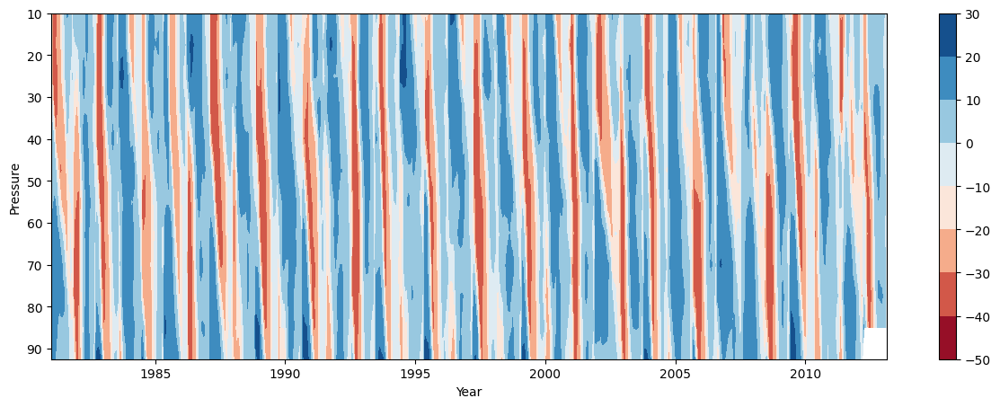

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

data = pd.read_csv('singapore.dat', skiprows=4, header=None, delim_whitespace=True, comment='h')

data = data[data[0] < 1900]

data = data.dropna(how='all')

data_values = data.values[:, 1:] * 0.1

total_months = data.shape[0]

start_year = 1981
years_per_record = 1 / 16

years = np.arange(start_year, start_year + total_months * years_per_record, years_per_record)

pa = np.arange(10, 100, 7.5)

fig = plt.figure(figsize=(15, 5))
plt.contourf(years, pa, data_values.T, cmap='RdBu')

plt.gca().invert_yaxis()
plt.colorbar()
plt.xlabel("Year")
plt.ylabel("Pressure")

plt.show()

Prac 11

In [ ]:
import netCDF4 as nc

ds = nc.Dataset('subset.nc')

print(ds)

print(ds.variables['precip'])
print(ds.variables['lat'])
print(ds.variables['lon'])
print(ds.variables['time'])
print(ds.variables['valid_yr_count'])

<class 'netCDF4._netCDF4.Dataset'>
root group (NETCDF3_CLASSIC data model, file format NETCDF3):
    Conventions: CF-1.0
    curator: Dr. Jian-Jian Wang
ESSIC, University of Maryland College Park
College Park, MD  20742  USA
Phone: +1 301-405-4887
    description: http://eagle1.umd.edu/GPCP_ICDR/GPCPmonthlyV2.3.pdf
    citation: Adler, R.F., G.J. Huffman, A. Chang, R. Ferraro, P. Xie, J. Janowiak, B. 
Rudolf, U. Schneider, S. Curtis, D. Bolvin, A. Gruber, J. Susskind, P. 
Arkin, 2003: The Version 2 Global Precipitation Climatology Project 
(GPCP) Monthly Precipitation Analysis (1979 - Present). J. Hydrometeor., 
4(6), 1147-1167.
    title: GPCP Version 2.3 Combined Precipitation Dataset (Final)
    platform: NOAA POES (Polar Orbiting Environmental Satellites)
    source_obs: CDR RSS SSMI/SSMIS Tbs over ocean 
CDR SSMI/SSMIS rainrates over land (Ferraro) 
Geo-IR (Xie) calibrated by SSMI/SSMIS rainrates for sampling 
TOVS/AIRS empirical precipitation estimates at higher latitudes 
(ocean

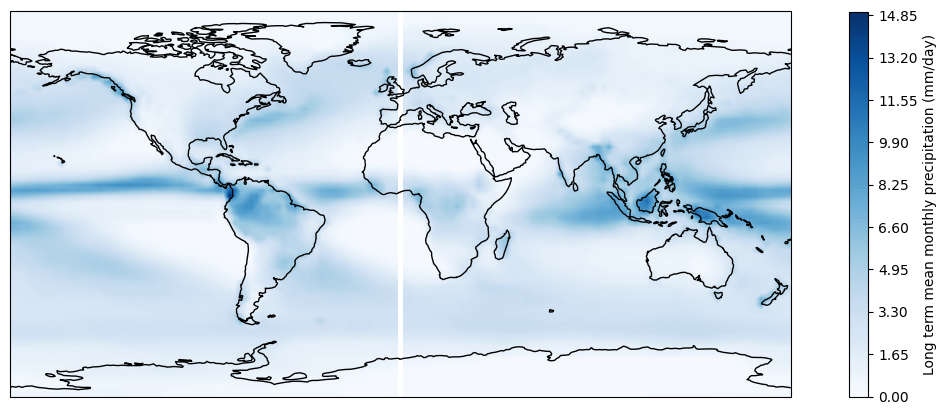

In [ ]:
import cartopy.feature as cfeature
import cartopy.crs as ccrs
import netCDF4 as nc
from netCDF4 import Dataset
import matplotlib.pyplot as plt
import numpy as np

fh = Dataset('subset.nc', 'r')

lat = fh.variables['lat'][:].data
lon = fh.variables['lon'][:].data
d_times = nc.num2date(fh.variables['time'][:], fh.variables['time'].units)

precip = fh.variables['precip'][:].data
preci_mean = np.mean(precip[:, :, :], axis=0)

fig = plt.figure(figsize=(15, 5))
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
im = ax.contourf(lon, lat, preci_mean, levels=100, cmap='Blues', transform=ccrs.PlateCarree())
ax.add_feature(cfeature.COASTLINE, edgecolor='black', zorder=1)
cbar = fig.colorbar(im, ax=ax, label='Long term mean monthly precipitation (mm/day)', extend='both')

plt.show()

**Prac 12**

In [ ]:
with open('R_THAIBINH_1961_2019.txt', 'r') as file:
    lines = file.readlines()

    for _ in range(2):
        lines.pop(0)

    for line in lines:
        print(line.strip())

#1961
1    0.0    0.2    0.6    0.0    0.0    0.0    0.0    0.0    2.6    0.0    0.0    0.0
2    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0   31.8   15.5    1.1    0.0
3    0.0    0.0    1.3    0.0    0.5   13.1   10.1    0.0    0.0    3.4    0.9    0.0
4    7.1    1.4    0.1    0.0    0.0    0.0    0.0    0.0    0.0    0.0    0.0    1.8
5    0.3    0.2    0.0    0.0    0.0    0.0    0.0    7.9    0.3    0.0    0.0    0.8
6    2.8    0.0    0.1    0.0    1.5    0.0    4.7    0.0   18.6    0.0    0.0    0.0
7    0.0    0.0    2.8    0.0    0.0   14.7    0.0    0.0    3.8    0.0    0.0    0.0
8    0.0    0.0    0.3    0.1    0.0    8.2    0.6   18.8   11.6    2.5   53.8    0.0
9    0.7    0.0   25.6    1.3    0.0    1.4    0.0    0.0    3.4    0.0    3.2    0.0
10    0.8    0.2    2.0    1.6    0.0    0.0    3.0    4.9    0.0   17.4    1.6    0.0
11    3.5    1.5    0.0   13.2    0.0   34.3    0.0    5.3    0.0   15.4    0.0    0.0
12    0.0    2.3    0.0    0.0   21.6   26.6  

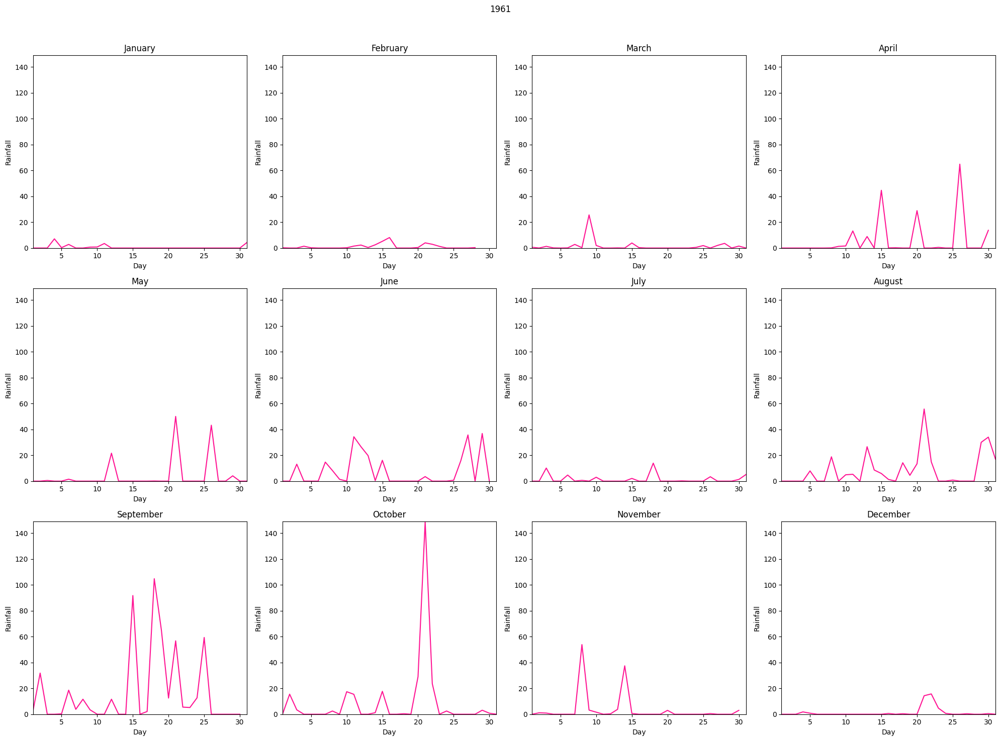

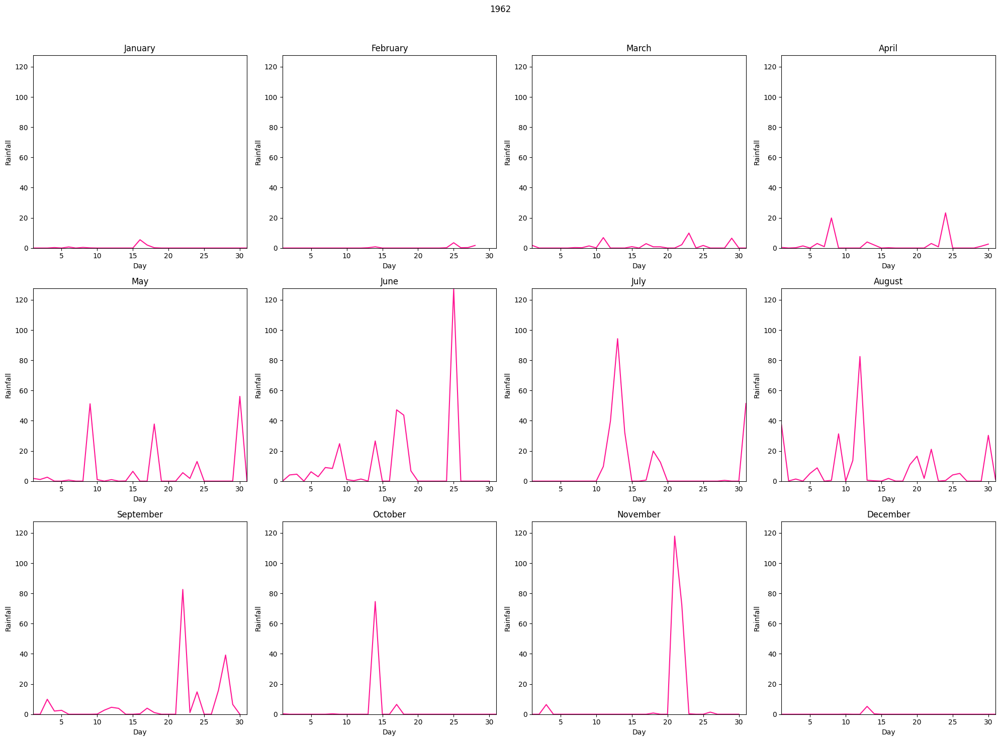

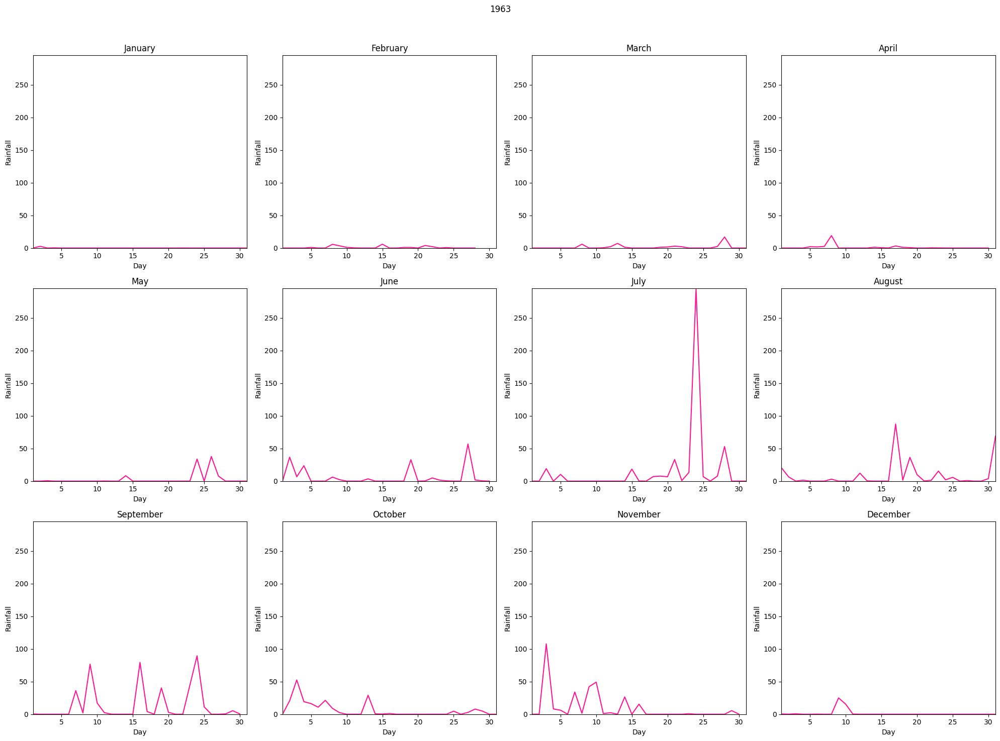

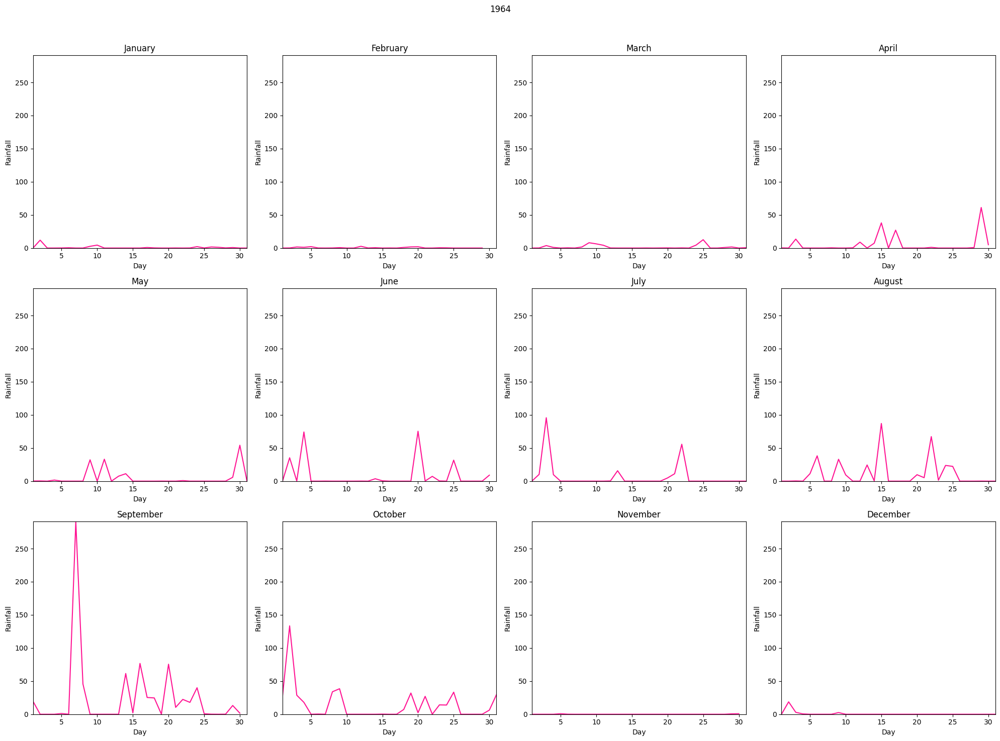

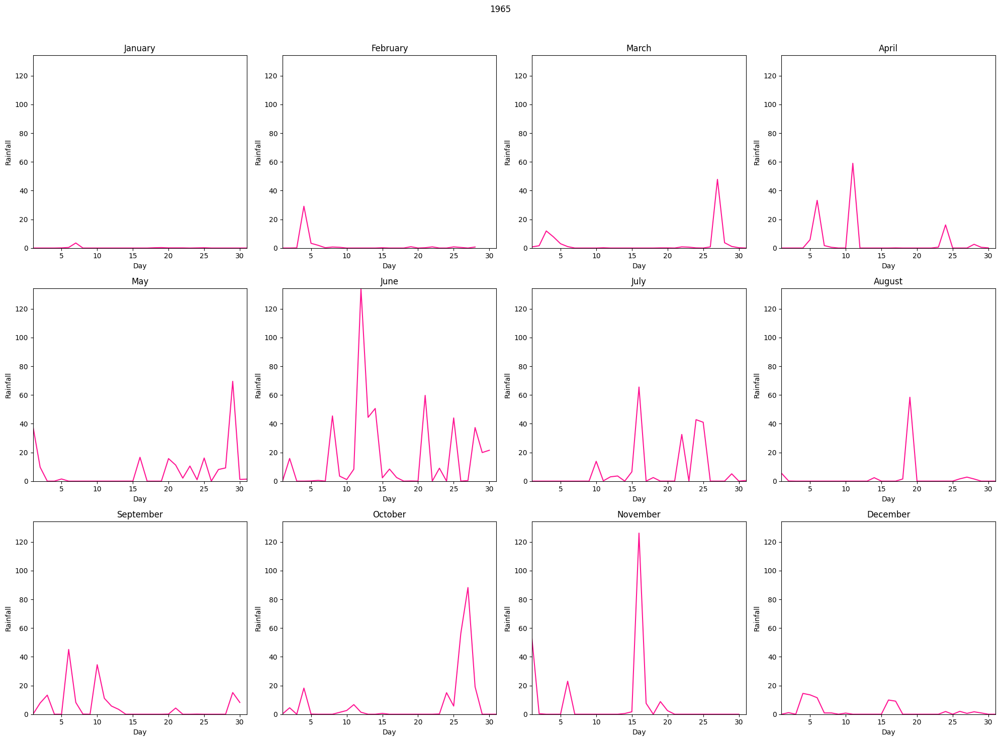

...

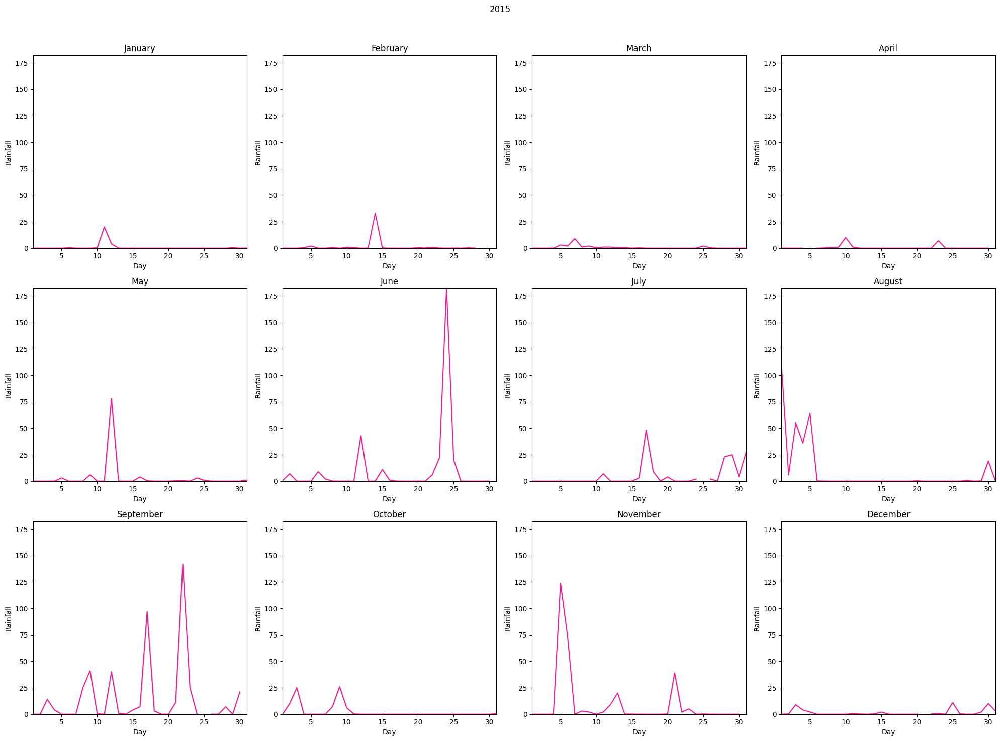

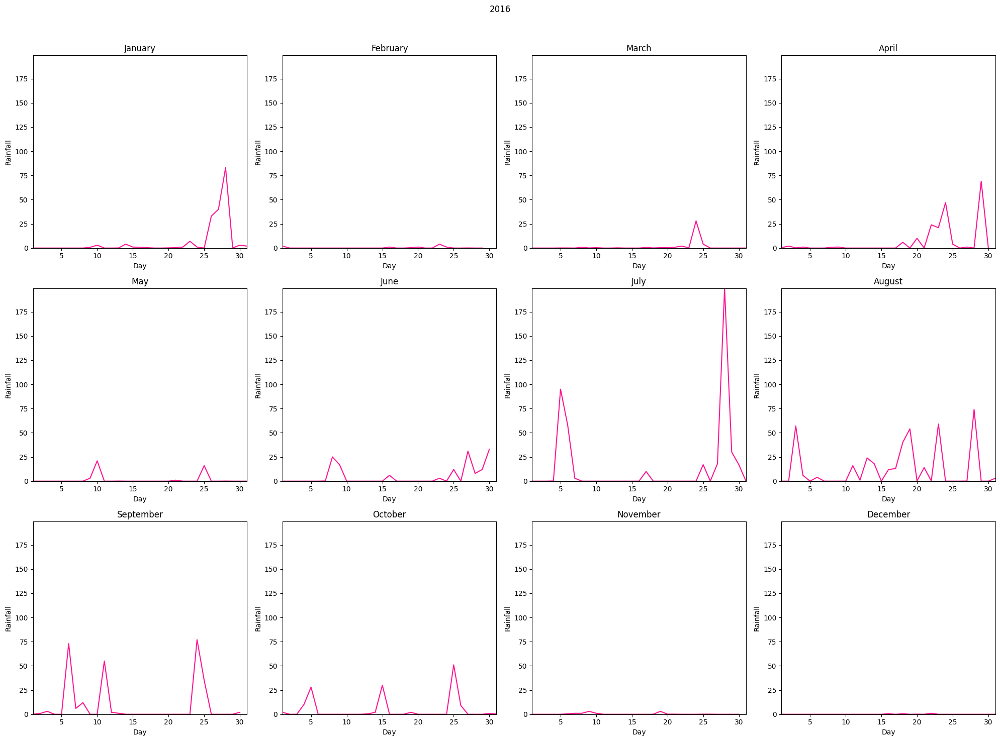

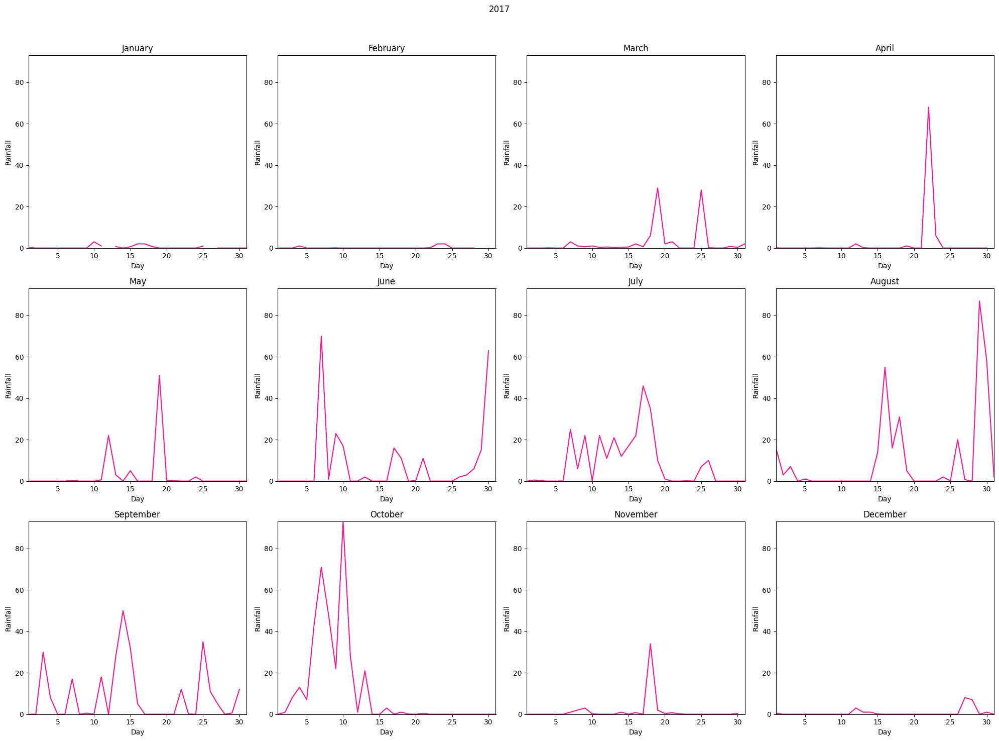

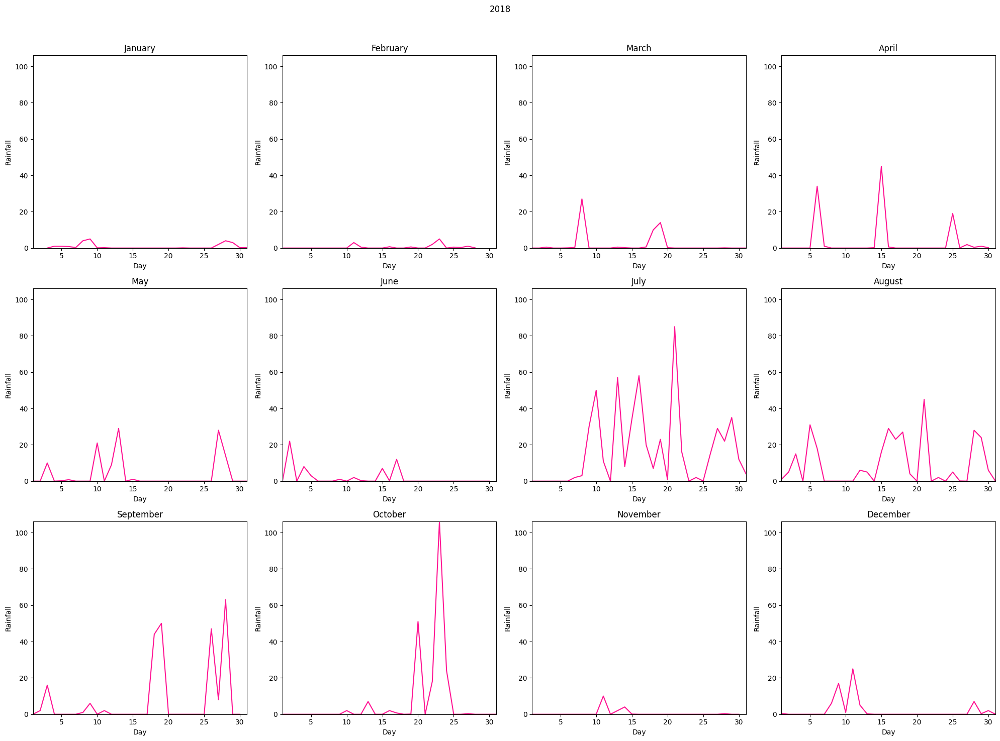

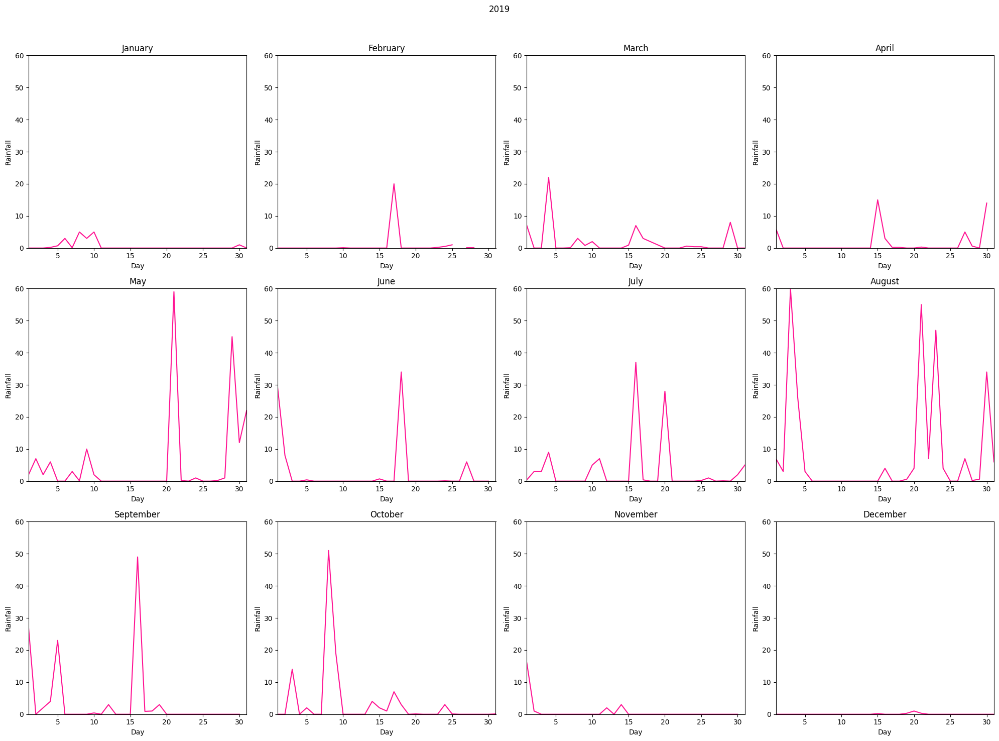

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

file_path = 'R_THAIBINH_1961_2019.txt'

def read_and_parse_data(file_path):
    with open(file_path, 'r') as file:
        lines = file.readlines()

    lines = lines[2:]

    data = []
    current_year = None

    for line in lines:
        line = line.strip()
        if line.startswith('#'):
            current_year = int(line[1:])
        elif current_year:
            values = line.split()
            day = int(values[0])
            for month in range(1, 13):
                if len(values) > month:
                    value = float(values[month])
                    if value == -99.0:
                        value = np.nan
                    data.append([current_year, month, day, value])

    df = pd.DataFrame(data, columns=['Year', 'Month', 'Day', 'Rainfall'])
    return df

def plot_daily_rainfall(dataframe):
    unique_years = dataframe['Year'].unique()
    month_names = [
        'January', 'February', 'March', 'April', 'May', 'June',
        'July', 'August', 'September', 'October', 'November', 'December'
    ]

    for year in unique_years:
        df_year = dataframe[dataframe['Year'] == year]

        fig, axs = plt.subplots(3, 4, figsize=(20, 15))
        fig.suptitle(f'{year}')

        x_min = df_year['Day'].min()
        x_max = df_year['Day'].max()
        y_min = df_year['Rainfall'].min()
        y_max = df_year['Rainfall'].max()

        for month in range(1, 13):
            month_data = df_year[df_year['Month'] == month]
            ax = axs[(month-1) // 4, (month-1) % 4]
            ax.plot(month_data['Day'], month_data['Rainfall'], color='deeppink')
            ax.set_title(month_names[month-1])
            ax.set_xlabel('Day')
            ax.set_ylabel('Rainfall')

            ax.set_xlim(x_min, x_max)
            ax.set_ylim(y_min, y_max)

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()

df = read_and_parse_data(file_path)
plot_daily_rainfall(df)

In [ ]:
file_path = 'R_THAIBINH_1961_2019.txt'

rainfall_data = []
current_year = None
max_precipitation_per_year = {}

with open(file_path, 'r') as file:
    next(file)
    next(file)
    for line in file:
        line = line.strip()
        if line.startswith('#'):
            current_year = int(line[1:])
            max_precipitation_per_year[current_year] = 0.0
        else:
            values = [float(value) for value in line.split()]
            values.insert(0, current_year)
            rainfall_data.append(values)
            max_precipitation_per_year[current_year] = max(max_precipitation_per_year[current_year], max(values[1:]))

for year, rx1day in max_precipitation_per_year.items():
    print(f"Year: {year}, RX1day: {rx1day} mm")

Year: 1961, RX1day: 148.8 mm
Year: 1962, RX1day: 127.5 mm
Year: 1963, RX1day: 294.9 mm
Year: 1964, RX1day: 290.7 mm
Year: 1965, RX1day: 134.1 mm
Year: 1966, RX1day: 209.9 mm
Year: 1967, RX1day: 140.0 mm
Year: 1968, RX1day: 164.7 mm
Year: 1969, RX1day: 82.3 mm
Year: 1970, RX1day: 131.1 mm
Year: 1971, RX1day: 144.4 mm
Year: 1972, RX1day: 100.9 mm
Year: 1973, RX1day: 227.5 mm
Year: 1974, RX1day: 189.8 mm
Year: 1975, RX1day: 253.6 mm
Year: 1976, RX1day: 122.7 mm
Year: 1977, RX1day: 182.8 mm
Year: 1978, RX1day: 187.5 mm
Year: 1979, RX1day: 206.1 mm
Year: 1980, RX1day: 210.5 mm
Year: 1981, RX1day: 100.2 mm
Year: 1982, RX1day: 215.8 mm
Year: 1983, RX1day: 167.8 mm
Year: 1984, RX1day: 135.5 mm
Year: 1985, RX1day: 188.5 mm
Year: 1986, RX1day: 70.3 mm
Year: 1987, RX1day: 64.7 mm
Year: 1988, RX1day: 123.9 mm
Year: 1989, RX1day: 172.0 mm
Year: 1990, RX1day: 300.3 mm
Year: 1991, RX1day: 143.7 mm
Year: 1992, RX1day: 113.7 mm
Year: 1993, RX1day: 81.2 mm
Year: 1994, RX1day: 169.4 mm
Year: 1995, RX1day

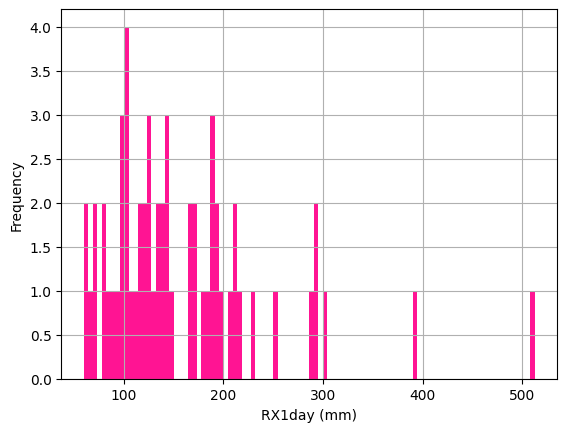

In [ ]:
import matplotlib.pyplot as plt

rx1day_values = list(max_precipitation_per_year.values())

plt.figure()
plt.hist(rx1day_values, bins=100, color = 'deeppink')
plt.xlabel('RX1day (mm)')
plt.ylabel('Frequency')

plt.grid(True)
plt.show()

In [ ]:
import numpy as np

rx1day_values = list(max_precipitation_per_year.values())

rx1day_values.sort()

return_periods = [5, 10, 20, 100]
return_values = []

for return_period in return_periods:
    rank = (len(rx1day_values) + 1) / return_period

    return_value = np.interp(rank, np.arange(1, len(rx1day_values) + 1), rx1day_values)
    return_values.append(return_value)

for i in range(len(return_periods)):
    print(f"Return period {return_periods[i]} years: {return_values[i]} mm")

Return period 5 years: 100.2 mm
Return period 10 years: 81.2 mm
Return period 20 years: 64.7 mm
Return period 100 years: 60.0 mm


In [ ]:
def calculate_return_values(dataframe):
    heavy_rainfall = dataframe[dataframe['Rainfall'] >= 50]['Rainfall'].tolist()
    heavy_rainfall.sort(reverse=True)

    return_periods = [5, 10, 20, 100]
    return_values = []

    for return_period in return_periods:
        rank = (len(heavy_rainfall) + 1) / return_period
        return_value = np.interp(rank, np.arange(1, len(heavy_rainfall) + 1), heavy_rainfall)
        return_values.append(return_value)

    return return_values

return_values = calculate_return_values(df)

for i in range(len(return_periods)):
    print(f"Return period {return_periods[i]} years: {return_values[i]:.2f} mm")

Return period 5 years: 101.22 mm
Return period 10 years: 135.59 mm
Return period 20 years: 182.76 mm
Return period 100 years: 290.69 mm


Prac 13

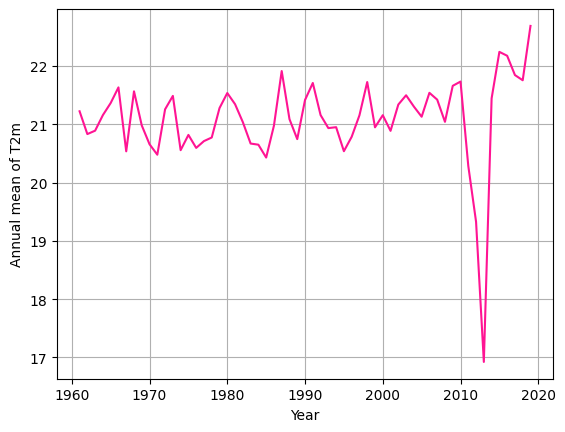

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

data = []
with open('T2m_THAIBINH_1961_2019.txt', 'r') as file:

    next(file)
    next(file)

    current_year = None
    for line in file:
        line = line.strip()
        if line.startswith('#'):
            current_year = int(line.split()[0][1:])
            continue
        values = [float(x) for x in line.split()]
        day = values[0]
        monthly_temps = values[1:]
        for month, temp in enumerate(monthly_temps):
            data.append([current_year, month + 1, day, temp])

df = pd.DataFrame(data, columns=['year', 'month', 'day', 'temperature'])

annual_mean = df.groupby('year')['temperature'].mean().values

years = list(range(1961, 2020))

plt.figure()
plt.plot(years, annual_mean, color = 'deeppink')
plt.xlabel('Year')
plt.ylabel('Annual mean of T2m')
plt.grid()
plt.show()

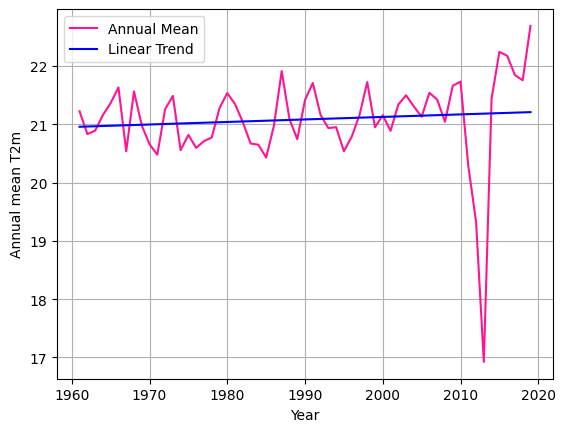

In [ ]:
slope, intercept = np.polyfit(years, annual_mean, 1)
trend_line = [slope * year + intercept for year in years]

plt.figure()
plt.plot(years, annual_mean, label='Annual Mean', color = 'deeppink')
plt.plot(years, trend_line, label='Linear Trend', color = 'blue')
plt.xlabel('Year')
plt.ylabel('Annual mean T2m')
plt.grid()
plt.legend()
plt.show()

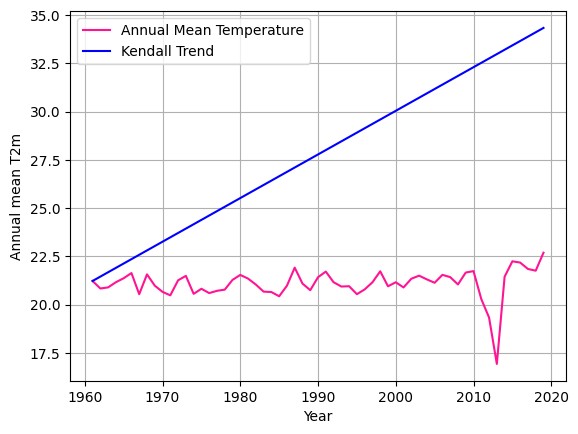

In [ ]:
!pip install scipy

from scipy.stats import kendalltau

tau, p_value = kendalltau(years, annual_mean)
trend_line = [tau * (year - 1961) + annual_mean[0] for year in years]

plt.figure()
plt.plot(years, annual_mean, label='Annual Mean Temperature', color = 'deeppink')
plt.plot(years, trend_line, label='Kendall Trend', color = 'blue')
plt.xlabel('Year')
plt.ylabel('Annual mean T2m')
plt.grid()
plt.legend()
plt.show()

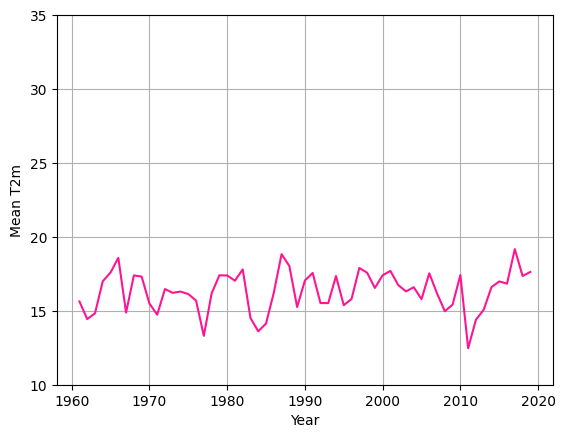

In [ ]:
january_temps = df[df['month'] == 1]['temperature']

january_mean_temps = [january_temps[df['year'] == year].mean() for year in years]

plt.figure()
plt.plot(years, january_mean_temps, color = 'deeppink')
plt.xlabel('Year')
plt.ylabel('Mean T2m')
plt.ylim(10, 35)
plt.grid()
plt.show()

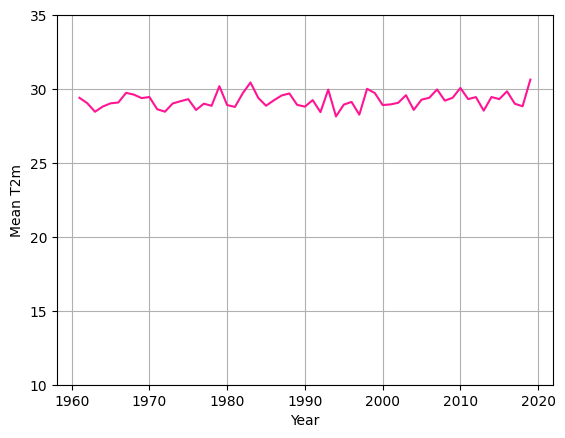

In [ ]:
july_temps = df[df['month'] == 7]['temperature']

july_mean_temps = [july_temps[df['year'] == year].mean() for year in years]

plt.figure()
plt.plot(years, july_mean_temps, color = 'deeppink')
plt.xlabel('Year')
plt.ylabel('Mean T2m')
plt.ylim(10, 35)
plt.grid()
plt.show()

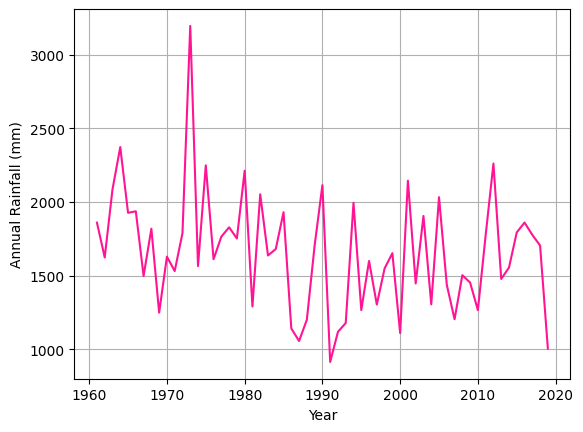

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

file_path = 'R_THAIBINH_1961_2019.txt'

def read_and_parse_data(file_path):
    with open(file_path, 'r') as file:
        lines = file.readlines()

    lines = lines[2:]

    data = []
    current_year = None

    for line in lines:
        line = line.strip()
        if line.startswith('#'):
            current_year = int(line[1:])
        elif current_year:
            values = line.split()
            day = int(values[0])
            for month in range(1, 13):
                if len(values) > month:
                    value = float(values[month])
                    if value == -99.0:
                        value = float('nan')
                    data.append([current_year, month, day, value])

    df = pd.DataFrame(data, columns=['Year', 'Month', 'Day', 'Rainfall'])
    return df

def plot_annual_rainfall(dataframe):
    unique_years = dataframe['Year'].unique()

    annual_rainfall = []
    for year in unique_years:
        df_year = dataframe[dataframe['Year'] == year]
        annual_rainfall.append([year, df_year['Rainfall'].sum()])

    annual_rainfall_df = pd.DataFrame(annual_rainfall, columns=['Year', 'Annual Rainfall'])

    plt.figure()
    plt.plot(annual_rainfall_df['Year'], annual_rainfall_df['Annual Rainfall'], color='deeppink')
    plt.xlabel('Year')
    plt.ylabel('Annual Rainfall (mm)')
    plt.grid()
    plt.show()

df = read_and_parse_data(file_path)
plot_annual_rainfall(df)